## 1. 处理半处理数据 （时间戳恢复处理、坐标整数化、拼接df为groupby准备）

In [1]:
## 读取数据（此数据的时间戳已处理为浮点数，经纬度已对应处理为x和y） ##
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
vehicle_n = 22
static_n = 21
refer_n = 12

data_m = [] # 移动站数据
for i in range(vehicle_n):
    data_m.append(pd.read_csv("Nanjing_vehicle_" + str(i) + ".csv"))

data_static= [] # 静态站数据
for i in range(static_n):
    data_static.append(pd.read_csv("Nanjing_static_" + str(i) + ".csv"))

data_refer = [] # 参考站数据
for i in range(refer_n):
    data_refer.append(pd.read_csv("Nanjing_refer_" + str(i) + ".csv"))

In [4]:
data_m[0]

,time,x,y,pm2d5,pm10,co,no2,o3,so2,tmp,hmd
0,650,1,5,31.962222,38.666667,280.000000,NaN,0.2,5.000000,8.511111,31.985556
1,652,1,5,32.816500,39.767500,135.342000,20.43,0.2,24.413500,8.810500,34.674500
2,654,1,5,32.733500,40.216500,108.009000,NaN,0.2,34.898000,9.143500,36.582500
3,656,1,5,32.482222,39.852222,102.825556,NaN,0.2,36.288333,9.396667,37.433333
4,658,1,5,32.066000,39.132000,170.207500,NaN,0.2,5.000000,9.694000,38.002000
...,...,...,...,...,...,...,...,...,...,...,...
80886,701724,3,6,22.783000,23.016500,77.491500,NaN,0.2,12.474000,17.400000,15.471500
80887,701726,2,5,22.616500,23.366500,74.073500,NaN,0.2,12.386500,17.400000,15.441000
80888,701728,2,5,26.382500,28.100000,73.646500,NaN,0.2,11.913500,17.400000,15.505000
80889,701730,1,5,21.267000,22.034000,76.859500,NaN,0.2,11.771000,17.412000,15.485500


In [3]:
## 将数据的浮点数时间戳和坐标 整数化 ##
import time
import itertools
import os

import matplotlib.pyplot as plt
import warnings
from scipy.optimize import leastsq
warnings.filterwarnings("ignore")


time_slice = 0.5
x_slice = 0.5
y_slice = 0.5



for i in range(vehicle_n):
    data_m[i].time = data_m[i].time * 60
    data_m[i].time = (data_m[i].time/time_slice - time_slice + 0.0001).astype("int")
    data_m[i].x = (data_m[i].x/x_slice - x_slice + 0.0001).astype("int")
    data_m[i].y = (data_m[i].y/y_slice - y_slice + 0.0001).astype("int")

for i in range(static_n):
    data_static[i].time = data_static[i].time * 60
    data_static[i].time = (data_static[i].time/time_slice - time_slice + 0.0001).astype("int")
    data_static[i].x = (data_static[i].x/x_slice - x_slice + 0.0001).astype("int")
    data_static[i].y = (data_static[i].y/y_slice - y_slice + 0.0001).astype("int")

for i in range(refer_n):
    data_refer[i].time = data_refer[i].time * 60
    data_refer[i].time = (data_refer[i].time/time_slice - time_slice + 0.0001).astype("int")
    data_refer[i].x = (data_refer[i].x/x_slice - x_slice + 0.0001).astype("int")
    data_refer[i].y = (data_refer[i].y/y_slice - y_slice + 0.0001).astype("int")

In [5]:
# 将浮点数时间戳恢复的小样例#
time_start = pd.Timestamp('2022-4-1 00:00:00+08:00')
time_end = pd.Timestamp('2021-12-1 00:00:00+08:00')
print(data_m[0].time)
print(time_start + pd.to_timedelta(data_m[0].time, unit='h') * time_slice/60)

0           650
1           652
2           654
3           656
4           658
          ...  
80886    701724
80887    701726
80888    701728
80889    701730
80890    701732
Name: time, Length: 80891, dtype: int64
0       2022-04-01 05:25:00+08:00
1       2022-04-01 05:26:00+08:00
2       2022-04-01 05:27:00+08:00
3       2022-04-01 05:28:00+08:00
4       2022-04-01 05:29:00+08:00
                   ...           
80886   2022-11-30 15:42:00+08:00
80887   2022-11-30 15:43:00+08:00
80888   2022-11-30 15:44:00+08:00
80889   2022-11-30 15:45:00+08:00
80890   2022-11-30 15:46:00+08:00
Name: time, Length: 80891, dtype: datetime64[ns, pytz.FixedOffset(480)]


In [8]:
## 将浮点数时间戳恢复 ##
time_start = pd.Timestamp('2022-4-1 00:00:00+08:00')
time_end = pd.Timestamp('2021-12-1 00:00:00+08:00')

for i in range(vehicle_n):
    data_m[i].time = time_start + pd.to_timedelta(data_m[i].time, unit='h') * time_slice/60
    data_m[i].time = pd.to_datetime(data_m[i]['time'])

for i in range(static_n):
    data_static[i].time = time_start + pd.to_timedelta(data_static[i].time, unit='h') * time_slice/60
    data_static[i]['time'] = pd.to_datetime(data_static[i]['time'])

for i in range(refer_n):
    data_refer[i].time = time_start + pd.to_timedelta(data_refer[i].time, unit='h') * time_slice/60
    data_refer[i].time = pd.to_datetime(data_refer[i]['time'])

In [46]:
## 设置时间为索引，但不宜提前设置，对后续groupby不便 ##

# for i in range(vehicle_n):
#     data_m[i].time = pd.to_datetime(data_m[i]['time'])
#     data_m[i] = data_m[i].set_index('time')

# for i in range(static_n):
#     data_static[i]['time'] = pd.to_datetime(data_static[i]['time'])
#     data_static[i] = data_static[i].set_index('time')

# for i in range(refer_n):
#     data_refer[i].time = pd.to_datetime(data_refer[i]['time'])
#     data_refer[i] = data_refer[i].set_index('time')

In [9]:
# 简单验证下，确实恢复正常时间戳 #
data_refer[1].time

0       2022-04-01 00:10:00+08:00
1       2022-04-01 00:15:00+08:00
2       2022-04-01 00:20:00+08:00
3       2022-04-01 00:25:00+08:00
4       2022-04-01 00:30:00+08:00
                   ...           
69768   2022-11-30 23:35:00+08:00
69769   2022-11-30 23:40:00+08:00
69770   2022-11-30 23:45:00+08:00
69771   2022-11-30 23:50:00+08:00
69772   2022-11-30 23:55:00+08:00
Name: time, Length: 69773, dtype: datetime64[ns, pytz.FixedOffset(480)]

In [50]:
## 下采样小时级数据，但这样并不适合统计相遇情况 ##

# data_m_hr = [] # 移动站数据
# for i in range(vehicle_n):
#     data_m_hr.append(data_m[0].resample(rule='M').mean())

# data_static_hr = [] # 静态站数据
# for i in range(static_n):
#     data_static_hr.append(data_static[0].resample(rule='M').mean())

# data_refer_hr = [] # 参考站数据
# for i in range(refer_n):
#     data_refer_hr.append(data_refer[0].resample(rule='M').mean())

In [7]:
## 把三种监测站的数据帧各自合并到三个对应链表中，同时为索引也创建相应链表 （原本的df是二维的，第一维指监测站序号） ##
static_List = []
static_List.extend(data_static[i] for i in range(static_n))
static_numList = []
static_numList.extend(i for i in range(static_n))

mob_List = []
mob_List.extend(data_m[i] for i in range(vehicle_n))
mob_numList = []
mob_numList.extend(i for i in range(vehicle_n))

ref_List = []
ref_List.extend(data_refer[i] for i in range(refer_n))
ref_numList = []
ref_numList.extend(i for i in range(refer_n))

In [8]:
## 把数据帧拼接起来，并置入索引，便于后续操作识别 ##
mob_tot = pd.concat(mob_List, keys=mob_numList)
ref_tot = pd.concat(ref_List, keys=ref_numList)
static_tot = pd.concat(static_List, keys=static_numList)

In [9]:
# 合并后的数据帧样例 #
mob_tot

time  x  y      pm2d5       pm10          co  \
0  0      2022-04-01 05:25:00+08:00  1  5  31.962222  38.666667  280.000000   
   1      2022-04-01 05:26:00+08:00  1  5  32.816500  39.767500  135.342000   
   2      2022-04-01 05:27:00+08:00  1  5  32.733500  40.216500  108.009000   
   3      2022-04-01 05:28:00+08:00  1  5  32.482222  39.852222  102.825556   
   4      2022-04-01 05:29:00+08:00  1  5  32.066000  39.132000  170.207500   
...                             ... .. ..        ...        ...         ...   
21 106073 2022-11-30 23:55:00+08:00  5  9   5.217000  10.000000   36.764500   
   106074 2022-11-30 23:56:00+08:00  5  9   5.883000  10.000000   35.561500   
   106075 2022-11-30 23:57:00+08:00  5  9   7.849500  10.000000   35.907000   
   106076 2022-11-30 23:58:00+08:00  5  9   9.533500  10.808000   38.379000   
   106077 2022-11-30 23:59:00+08:00  5  9   7.157500  10.000000   36.756000   

             no2      o3        so2        tmp        hmd  
0  0         NaN  0.2000   5.000000   8.511111  31.985556  
   1       20.43  0.2000  24.413500   8.810500  34.674500  
   2         NaN  0.2000  34.898000   9.143500  36.582500  
   3         NaN  0.2000  36.288333   9.396667  37.433333  
   4         NaN  0.2000   5.000000   9.694000  38.002000  
...          ...     ...        ...        ...        ...  
21 106073    NaN     NaN   5.000000  18.619500  46.149500  
   106074    NaN  0.2000   5.000000  19.160000  45.238000  
   106075    NaN  0.2000   5.000000  19.684500  44.480000  
   106076    NaN  0.4030   5.000000  20.207000  43.799000  
   106077    NaN  0.2135   5.000000  20.723000  43.152000  

[2164248 rows x 11 columns]

In [10]:
data_tot = pd.concat((mob_tot, ref_tot, static_tot), keys=('mob', 'ref', 'stat'))

In [92]:
pd.to_pickle(data_tot, 'data_tot.pkl')

In [11]:
data_tot

time   x   y      pm2d5       pm10  \
mob  0  0      2022-04-01 05:25:00+08:00   1   5  31.962222  38.666667   
        1      2022-04-01 05:26:00+08:00   1   5  32.816500  39.767500   
        2      2022-04-01 05:27:00+08:00   1   5  32.733500  40.216500   
        3      2022-04-01 05:28:00+08:00   1   5  32.482222  39.852222   
        4      2022-04-01 05:29:00+08:00   1   5  32.066000  39.132000   
...                                  ...  ..  ..        ...        ...   
stat 20 319739 2022-11-25 09:52:00+08:00  16  12  68.500000  75.750000   
        319740 2022-11-25 09:53:00+08:00  16  12  67.750000  75.000000   
        319741 2022-11-25 09:54:00+08:00  16  12  64.650000  72.700000   
        319742 2022-11-25 09:55:00+08:00  16  12  64.400000  72.950000   
        319743 2022-11-25 09:56:00+08:00  16  12  66.789474  74.684211   

                        co        no2    o3        so2        tmp        hmd  
mob  0  0       280.000000        NaN   0.2   5.000000   8.511111  31.985556  
        1       135.342000  20.430000   0.2  24.413500   8.810500  34.674500  
        2       108.009000        NaN   0.2  34.898000   9.143500  36.582500  
        3       102.825556        NaN   0.2  36.288333   9.396667  37.433333  
        4       170.207500        NaN   0.2   5.000000   9.694000  38.002000  
...                    ...        ...   ...        ...        ...        ...  
stat 20 319739    7.005000   9.275000  24.0  32.910000  20.300000  49.710000  
        319740    6.000000   6.650000  24.0  35.400000  20.300000  49.380000  
        319741    6.000000   6.340000  24.0  35.565000  20.300000  49.325000  
        319742    6.000000   3.090000  24.0  33.565000  20.300000  49.125000  
        319743    6.000000   7.210526  24.0  33.463158  20.305263  48.947368  

[8774209 rows x 11 columns]

## 2. 读取处理后数据 & groupby 并得到所有rendezvous分组（可直接从这里复现）

In [1]:
# 可以直接读取后续已经分组好的相遇列表数据 ！！！ #
# 读取之前已存好的数据大集合， pickle（接近原本，建议使用，含multi-index）或 #
# csv（包含新增的indices：type, label, num; 但是是从表格直接改的，索引不方便！）#
import pandas as pd

data_tot = []
data_tot = pd.read_pickle('data_tot.pkl')
# data_tot = pd.read_csv('data_tot.csv')


In [2]:
data_tot.index

MultiIndex([( 'mob',  0,      0),
            ( 'mob',  0,      1),
            ( 'mob',  0,      2),
            ( 'mob',  0,      3),
            ( 'mob',  0,      4),
            ( 'mob',  0,      5),
            ( 'mob',  0,      6),
            ( 'mob',  0,      7),
            ( 'mob',  0,      8),
            ( 'mob',  0,      9),
            ...
            ('stat', 20, 319734),
            ('stat', 20, 319735),
            ('stat', 20, 319736),
            ('stat', 20, 319737),
            ('stat', 20, 319738),
            ('stat', 20, 319739),
            ('stat', 20, 319740),
            ('stat', 20, 319741),
            ('stat', 20, 319742),
            ('stat', 20, 319743)],
           length=8774209)

In [2]:
# 按时空坐标分组 #
group = data_tot.groupby(['time', 'x', 'y'])

In [3]:
# 已保存本地，在后面代码块执行，筛选出group中元素数量大于1的分组，即存在多个单位相遇， 耗时 11m56s ～ 15m21s #
rendezvous = []
for i in group:        
    if i[1].shape[0] > 1:
        rendezvous.append(i[1])

In [4]:
len(rendezvous)

363313

In [8]:
## 将相遇统计好的列表保存为pkl，后续可直接读取 ##
import pickle

# with open('rendezvous.pkl', 'wb') as f:
#     pickle.dump(rendezvous, f)


In [1]:
# 这里开始执行！！！ 从pickle文件中加载回内存 ~3m #
import pickle

with open('rendezvous.pkl', 'rb') as f:
    rendezvous = pickle.load(f)
    


In [36]:
multiRend = []
for i in rendezvous:
    if (len(i) > 2 and 'ref' in i.index):
        multiRend.append(i)

In [48]:
# 使用concat()函数将列表中的DataFrame对象合并

multiRend_df = pd.concat(multiRend)

print(multiRend_df)


                                    time   x   y      pm2d5       pm10  \
mob  0  71     2022-04-01 07:25:00+08:00   9  12  36.383500  45.066500   
ref  8  87     2022-04-01 07:25:00+08:00   9  12  32.882000  54.392000   
stat 13 445    2022-04-01 07:25:00+08:00   9  12  14.450000  16.800000   
mob  0  265    2022-04-01 15:15:00+08:00   9  12  11.402632  11.666316   
ref  8  181    2022-04-01 15:15:00+08:00   9  12  17.582000  34.696000   
...                                  ...  ..  ..        ...        ...   
mob  10 104213 2022-11-30 14:45:00+08:00   9  12  16.250000  16.966500   
ref  8  69605  2022-11-30 14:45:00+08:00   9  12  10.051000  21.682000   
mob  13 89556  2022-11-30 16:30:00+08:00  10  14  12.666500  13.099500   
     14 41248  2022-11-30 16:30:00+08:00  10  14  18.433500  20.937500   
ref  7  66868  2022-11-30 16:30:00+08:00  10  14  18.380000  40.464000   

                        co    no2      o3         so2        tmp        hmd  
mob  0  71      104.324500    NaN

In [51]:
multiRend_df.iloc[0]

time     2022-04-01 07:25:00+08:00
x                                9
y                               12
pm2d5                      36.3835
pm10                       45.0665
co                        104.3245
no2                            NaN
o3                             0.2
so2                        30.0745
tmp                        15.8045
hmd                         33.333
Name: (mob, 0, 71), dtype: object

In [44]:
multiRend[1].index.levels[1]

Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21],
      dtype='int64')

In [46]:
Combo = multiRend.groupby(level=['level0', 'level1'])

AttributeError: 'list' object has no attribute 'groupby'

In [6]:
# 统计不同相遇规模（一次相遇的单位数量）的数量, 运行时间13m20s #
count2 = 0
count3 = 0
count4 = 0
count5 = 0
countMore = 0 

for i in group:
    if i[1].shape[0] == 2:
        count2 += 1
    elif i[1].shape[0] == 3:
        count3 += 1
    elif i[1].shape[0] == 4:
        count4 += 1
    elif i[1].shape[0] == 5:
        count5 += 1
    elif i[1].shape[0] > 5:
        countMore += 1

print(count2, count3, count4, count5, countMore)

290313 14784 18193 1999 38024


(array([1., 2., 3., 4., 5., 6., 7.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

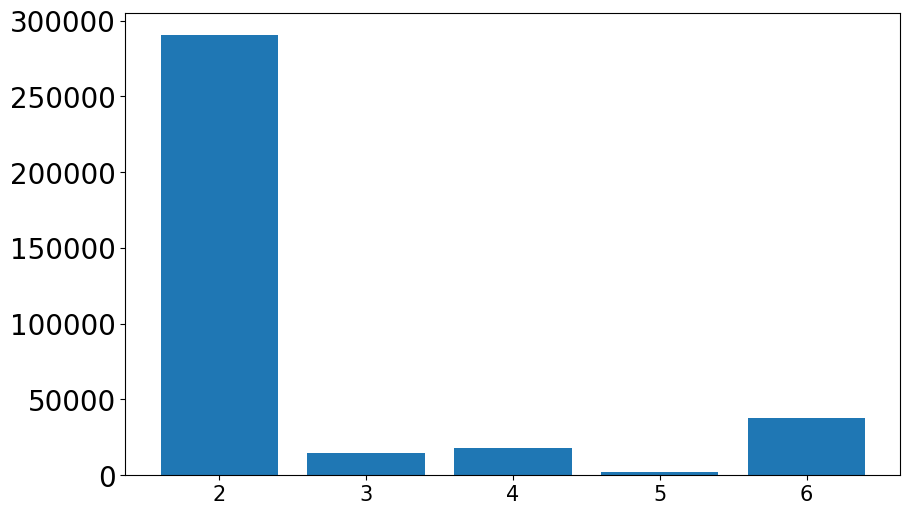

In [13]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.bar([2,3,4,5,6], [count2, count3, count4, count5, countMore])
plt.yticks(fontsize=20)
plt.xticks(fontsize=15)

## 3. 单辆 mobile LCS#0 分析

In [ ]:
# 得到 LCS0 所有相遇，mob_0, 共22457次相遇, 耗时 #
mob_0 = []
for i in rendezvous:
    for j in i.index:
        if (j[0] == 'mob') & (j[1] == 0):
            mob_0.append(i)

print(len(mob_0))

22457


In [98]:
mob_0

[                                time   x  y   pm2d5     pm10       co    no2  \
 mob  0 37  2022-04-01 06:36:00+08:00  12  5  33.433  41.6665  97.4835    NaN   
      1 90  2022-04-01 06:36:00+08:00  12  5  36.183  44.8005  37.5700    NaN   
 stat 6 396 2022-04-01 06:36:00+08:00  12  5  43.050  53.3500   6.0000  7.225   
 
                  o3     so2      tmp     hmd  
 mob  0 37    0.2000  31.204  13.9000  36.435  
      1 90    0.3115   5.000  19.2985  37.395  
 stat 6 396  24.0000  16.350  12.2000  42.200  ,
                                 time   x  y   pm2d5     pm10       co    no2  \
 mob  0 38  2022-04-01 06:37:00+08:00  12  5  34.283  42.1335  93.9065    NaN   
      1 91  2022-04-01 06:37:00+08:00  12  5  39.200  48.2495  38.7285    NaN   
 stat 6 397 2022-04-01 06:37:00+08:00  12  5  45.300  56.9000   6.0000  6.125   
 
               o3     so2      tmp     hmd  
 mob  0 38    NaN  29.768  13.9065  36.299  
      1 91    0.3   5.000  19.3650  37.190  
 stat 6 397  24.0  1

In [99]:
# 统计包含静态站的所有相遇 #
mob_0_stat = []

for i in mob_0:
    for j in i.index:
        if ((j[0] == 'stat') | (j[0] == 'ref')):
            mob_0_stat.append(i)
            continue ## 避免重复项！

len(mob_0_stat)

13238

In [142]:
mob_0_filter = []

for i in mob_0_stat:
    if 'stat' in i.index:
        if (i.loc[('stat')].pm2d5.squeeze() < 10):
            continue
        else:
            mob_0_filter.append(i)
    elif 'ref' in i.index:
        if (i.loc[('ref')].pm2d5.squeeze() < 5):
            continue
        else:
            mob_0_filter.append(i)      

In [143]:
len(mob_0_filter)

11237

In [150]:
mob_0_filter

[                                time   x  y   pm2d5     pm10       co    no2  \
 mob  0 37  2022-04-01 06:36:00+08:00  12  5  33.433  41.6665  97.4835    NaN   
      1 90  2022-04-01 06:36:00+08:00  12  5  36.183  44.8005  37.5700    NaN   
 stat 6 396 2022-04-01 06:36:00+08:00  12  5  43.050  53.3500   6.0000  7.225   
 
                  o3     so2      tmp     hmd  
 mob  0 37    0.2000  31.204  13.9000  36.435  
      1 90    0.3115   5.000  19.2985  37.395  
 stat 6 396  24.0000  16.350  12.2000  42.200  ,
                                 time   x  y   pm2d5     pm10       co    no2  \
 mob  0 38  2022-04-01 06:37:00+08:00  12  5  34.283  42.1335  93.9065    NaN   
      1 91  2022-04-01 06:37:00+08:00  12  5  39.200  48.2495  38.7285    NaN   
 stat 6 397 2022-04-01 06:37:00+08:00  12  5  45.300  56.9000   6.0000  6.125   
 
               o3     so2      tmp     hmd  
 mob  0 38    NaN  29.768  13.9065  36.299  
      1 91    0.3   5.000  19.3650  37.190  
 stat 6 397  24.0  1

In [153]:
'stat' in mob_0_stat[13236].index

True

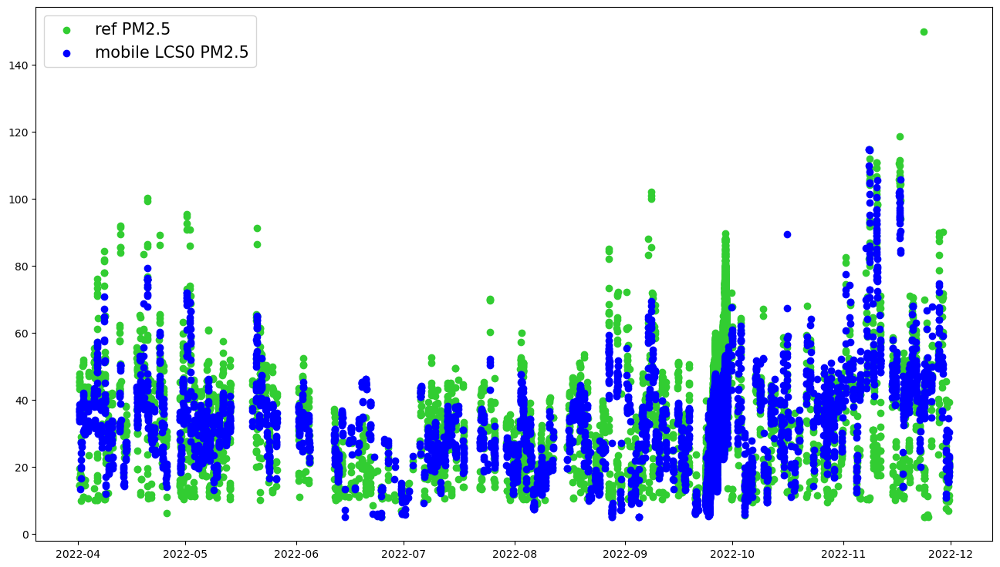

In [161]:
## 观察某LCS测量及其参考值数据分布 ##

import matplotlib.dates as mdates

Timeaxis = []
M_lcs = []
ref = []


Timeaxis.extend(i.time[0] for i in mob_0_filter)
M_lcs.extend(i.pm2d5[0] for i in mob_0_filter)
for i in mob_0_filter:
    if 'stat' in i.index:
        ref.append(i.loc['stat'].pm2d5.squeeze())
    elif 'ref' in i.index:
        ref.append(i.loc['ref'].pm2d5.squeeze())

fig = plt.figure(figsize=(16,9))


# plt.plot(Timeaxis, ref, 'r', label='PM2.5 of static references')
# plt.plot(Timeaxis, M_lcs, 'g', label='PM2.5 of mobile LCS#13')
plt.scatter(Timeaxis, ref, color= 'limegreen',label='ref PM2.5')
plt.scatter(Timeaxis, M_lcs, color= 'blue', label='mobile LCS0 PM2.5')

plt.legend(loc='best',fontsize=15)

plt.show()

## 4. 逐辆分析 （分别统计与静态站/标准站的相遇情况，异常值过滤）

In [ ]:
rendezvous

[                               time   x   y    pm2d5   pm10        co    no2  \
 mob  17 0 2022-04-01 00:00:00+08:00  14  14  24.8335  25.80  261.6175    NaN   
 stat 11 0 2022-04-01 00:00:00+08:00  14  14  18.1000  20.15    6.0000  9.365   
 
              o3      so2   tmp     hmd  
 mob  17 0   0.2  115.709  17.4  29.182  
 stat 11 0  24.0   10.375  12.4  32.065  ,
                                time   x   y  pm2d5   pm10       co    no2  \
 mob  17 1 2022-04-01 00:01:00+08:00  14  14  25.25  25.80  259.098    NaN   
 stat 11 1 2022-04-01 00:01:00+08:00  14  14  18.95  20.85    6.000  10.55   
 
              o3       so2   tmp    hmd  
 mob  17 1   0.2  114.8165  17.4  29.10  
 stat 11 1  24.0   12.1850  12.4  32.15  ,
                                time   x   y   pm2d5     pm10       co   no2  \
 mob  17 2 2022-04-01 00:02:00+08:00  14  14  24.766  25.9995  258.734   NaN   
 stat 11 2 2022-04-01 00:02:00+08:00  14  14  18.950  20.6500    6.000  8.64   
 
              o3      s

In [2]:
## 分车号各自统计相遇数据 ##
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
vehicle_n = 22
static_n = 21
refer_n = 12


mob_rendezvous = [[] for _ in range(vehicle_n)] 

for i in rendezvous:
    for j in i.index:
        if j[0] == 'mob':
            mob_rendezvous[j[1]].append(i)

In [11]:
## 预览各个LCS的相遇次数 ##
for i in range(vehicle_n):
    print(len(mob_rendezvous[i])) 

22457
32782
22135
22660
19657
18204
11155
12638
20197
19571
20952
15435
21787
25288
14763
14336
36781
78373
15326
18769
26136
19831


### 含静态站相遇，及过滤异常值

In [12]:
# 统计包含静态参考站的所有相遇（含异常值） #

mob_rendezvous_stat = [[] for _ in range(vehicle_n)]
count = 0

for i in mob_rendezvous:
    for j in i:
        if (('stat' in j.index) | ('ref' in j.index)):
            # print(k)
            mob_rendezvous_stat[count].append(j)
            continue
    count += 1 
  
for i in range(vehicle_n):
    print(len(mob_rendezvous_stat[i]))

12814
24704
12426
13019
10175
9685
11155
11331
18094
6290
18445
1485
7253
23560
13247
13002
21630
64700
14819
17256
12802
2705


In [14]:
mob_rendezvous_stat[0][0].loc['stat']

,,time,x,y,pm2d5,pm10,co,no2,o3,so2,tmp,hmd
6,396,2022-04-01 06:36:00+08:00,12,5,43.05,53.35,6.0,7.225,24.0,16.35,12.2,42.2


In [15]:
## 基于上述相遇，把静态站异常值去除后的cases ##

mob_rendezvous_stat_filter = [[] for _ in range(vehicle_n)]
count = 0
for i in mob_rendezvous_stat:
    for j in i:
        if 'stat' in j.index:
            if(j.loc['stat'].shape[0] == 1): # 避免个别数据漂移，导致一个坐标内存在两个静态站 #
                if ((j.loc[('stat')].pm2d5.squeeze() >= 10) and (j.loc[('stat')].pm2d5.squeeze() < 300)):
                    mob_rendezvous_stat_filter[count].append(j)                
        elif 'ref' in j.index:
            if ((j.loc[('ref')].pm2d5.squeeze() >= 8 ) and (j.loc[('ref')].pm2d5.squeeze() < 300)):
                mob_rendezvous_stat_filter[count].append(j)
    count += 1 

In [17]:
## 每一辆移动lcs包含静态参考站的相遇次数(去除异常值后) ##
for i in range(vehicle_n):
    print(i, len(mob_rendezvous_stat_filter[i])) 

0 11065
1 22750
2 10668
3 11096
4 9716
5 9243
6 5
7 133
8 6290
9 5983
10 6828
11 1302
12 6919
13 9928
14 1911
15 1601
16 16697
17 58378
18 2735
19 5803
20 12217
21 1786


In [18]:
mob_rendezvous_stat_filter[3][0].loc['mob', 3].pm2d5.squeeze() - mob_rendezvous_stat_filter[3][0].loc['stat'].pm2d5.squeeze()

-2.799500000000002

### 标准站过滤异常值

In [3]:
# 统计必须包含国标站的所有相遇 #

mob_rendezvous_ref = [[] for _ in range(vehicle_n)]
count = 0

for i in mob_rendezvous:
    for j in i:
        if ('ref' in j.index):
            # print(k)
            mob_rendezvous_ref[count].append(j)
            continue
    count += 1 
  
for i in range(vehicle_n):
    print(len(mob_rendezvous_ref[i]))

850
618
825
905
63
39
5
26
212
48
306
1046
1161
9507
192
176
1479
62
26
1158
569
78


In [4]:
## 基于上述相遇，把静态站异常值去除后的cases ##

mob_rendezvous_ref_filter = [[] for _ in range(vehicle_n)]
count = 0
for i in mob_rendezvous_ref:
    for j in i:
        if 'stat' in j.index:
            if(j.loc['stat'].shape[0] == 1): # 避免个别数据漂移，导致一个坐标内存在两个静态站 #
                if ((j.loc[('stat')].pm2d5.squeeze() >= 10) and (j.loc[('stat')].pm2d5.squeeze() < 300)):
                    mob_rendezvous_ref_filter[count].append(j)                
        elif 'ref' in j.index:
            if ((j.loc[('ref')].pm2d5.squeeze() >= 8 ) and (j.loc[('ref')].pm2d5.squeeze() < 300)):
                mob_rendezvous_ref_filter[count].append(j)
    count += 1 

In [ ]:
## 每一辆移动lcs包含标准站的相遇次数(去除异常值后) ##
for i in range(vehicle_n):
    print(i, len(mob_rendezvous_ref_filter[i])) 

0 570
1 368
2 566
3 622
4 49
5 28
6 5
7 23
8 188
9 44
10 249
11 891
12 1039
13 8180
14 165
15 143
16 1372
17 54
18 21
19 1055
20 480
21 52


## 5. 计算相遇误差 (Cal_err, axis_xy这两个函数的定义在这里)

In [10]:
## 计算每个相遇点的绝对误差的函数（含对应时间戳），并将其转为dataframe。可输入需要计算的移动LCS号n ##
def cal_abs_err(error_list, rendezvous, n=0):
    """ 计算每个相遇点的绝对误差的函数，但是需要注意默认算与标准站的误差，需要改变的话得在函数中改对应dataframe。
    
    Args:
        error (dataframe): 预声明的误差列表
        mob_rendezvous_ref_filter (dataframegroupby): 需要分析的 groupby
        n (int, optional): LCS标号. Defaults to 0.

    Returns:
        Dataframe: error
    """
    
    error = []
    
    for i in rendezvous[n]:
        if('ref' in i.index):
            error.append([i.time[0], abs(i.loc[('mob', n)].pm2d5.squeeze() - i.loc['ref'].pm2d5.squeeze())]) # squeeze()不能少
        # else:
        #     error.append([i.time[0], abs(i.loc[('mob', n)].pm2d5.squeeze() - i.loc['stat'].pm2d5.squeeze())])

    if len(error) > 0:
        error = pd.DataFrame(error)
        error.rename(columns={0:'time', 1:'error'}, inplace=True)

        error['time'] = pd.to_datetime(error['time'])
        error = error.set_index('time')
        error_list.append(error)
    return 

In [11]:
## 计算每个相遇点的误差(正偏or负偏)的函数（含对应时间戳），并将其转为dataframe。可输入需要计算的移动LCS号n ##
def cal_err(error_list, rendezvous, n=0):
    """ 计算每个相遇点的误差的函数，但是需要注意默认算与标准站的误差，需要改变的话得在函数中改对应dataframe。
    
    Args:
        error (dataframe): 预声明的误差列表
        mob_rendezvous_ref_filter (dataframegroupby): 需要分析的 groupby
        n (int, optional): LCS标号. Defaults to 0.

    Returns:
        Dataframe: error
    """
    
    error = []
    
    for i in rendezvous[n]:
        if('ref' in i.index):
            error.append([i.time[0], i.loc[('mob', n)].pm2d5.squeeze() - i.loc['ref'].pm2d5.squeeze()]) # squeeze()不能少
        # else:
        #     error.append([i.time[0], abs(i.loc[('mob', n)].pm2d5.squeeze() - i.loc['stat'].pm2d5.squeeze())])

    if len(error) > 0:
        error = pd.DataFrame(error)
        error.rename(columns={0:'time', 1:'error'}, inplace=True)

        error['time'] = pd.to_datetime(error['time'])
        error = error.set_index('time')
        error_list.append(error)
    return 

In [6]:
## 计算画图对应的时间戳，以及LCS和参考站的数据点对
def axis_xy(rendezvous, Timeaxis_list, M_lcs_list, ref_list, n=0):
    """ 计算画图需要的x轴-时间戳，y轴-M_lcs/ref 原始读数/参考站读数，n-需要计算的lcs；
    

    Args:
        mob_rendezvous_ref_filter (dataframegroupby): 需要分析的 groupby
        Timeaxis (list of lists): 所有数据对的时间戳
        M_lcs (list of lists): 所有原读数
        ref (list of lists): 所有参考读数
        n (int, optional): LCS的标号. Defaults to 0.

    Returns:
        In-place 列表操作，无返回
    """
    Timeaxis= [] # timestamp of every rendezvous, not averaged!
    M_lcs = [] # raw reading of LCS
    ref= [] # respective reference measurement
    # Timeaxis.append(i.time[0] for i in mob_rendezvous_ref_filter[n])
    # M_lcs.append(i.loc['mob', n].pm2d5.squeeze() for i in mob_rendezvous_ref_filter[n])
    for i in rendezvous[n]:
        if 'ref' in i.index:
            ref.append(i.loc['ref'].pm2d5.squeeze())
            Timeaxis.append(i.time[0])
            M_lcs.append(i.loc['mob', n].pm2d5.squeeze())
        # else:
        #     ref.append(i.loc['stat'].pm2d5.squeeze())

    Timeaxis_list.append(Timeaxis)
    M_lcs_list.append(M_lcs) # raw reading of LCS
    ref_list.append(ref) # respective reference measurement
    return

In [12]:
## 利用上述两个函数，画图所需x、y轴参数计算，注意，传入的是总链表，各个函数每次计算结果为单个列表/df ##

# Timeaxis_list = [[] for _ in range(vehicle_n)] # timestamp of every rendezvous, not averaged!
# M_lcs_list = [[] for _ in range(vehicle_n)] # raw reading of LCS
# ref_list = [[] for _ in range(vehicle_n)] # respective reference measurement
# error_list =[[] for _ in range(vehicle_n)] ## |M_lcs - ref|, the absolute error between LCS and ref
Timeaxis_list = [] # timestamp of every rendezvous, not averaged!
M_lcs_list = [] # raw reading of LCS
ref_list = [] # respective reference measurement
error_list =[] ## |M_lcs - ref|, the absolute error between LCS and ref
for i in range(vehicle_n):
    axis_xy(mob_rendezvous_ref_filter, Timeaxis_list, M_lcs_list, ref_list, i)
    cal_err(error_list, mob_rendezvous_ref_filter, i) # 计算原误差
    # cal_abs_err(error_list, mob_rendezvous_ref_filter, i) # 计算误差绝对值

In [57]:
Timeaxis_list = [] # timestamp of every rendezvous, not averaged!
M_lcs_list = [] # raw reading of LCS
ref_list = [] # respective reference measurement
axis_xy(Timeaxis_list, M_lcs_list, ref_list, 0)

In [13]:
Timeaxis_list[6]

[Timestamp('2022-05-30 15:45:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-05-30 15:50:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-05-30 15:55:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-05-30 16:00:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-05-30 16:05:00+0800', tz='pytz.FixedOffset(480)')]

## 6. 平均时间戳，提升画图美观度 (似乎没啥必要了)

In [10]:
## 按天resample数据，并把数据存入列表 ##
err_box = [[] for _ in range(vehicle_n)] # 按天聚合rendezvous数据
for idx, i in error_list:
    for j in i.resample('D'):
        err_box[idx].append(j)

## 每天的数据点时间戳取平均得到对应的x轴，画图美观所需 ##
err_day_x = [i[1].index.mean() for i in err_box]

ValueError: not enough values to unpack (expected 2, got 1)

In [15]:
err_box

[(Timestamp('2022-04-02 00:00:00+0800', tz='pytz.FixedOffset(480)', freq='D'),
                                error
  time                               
  2022-04-02 09:20:00+08:00  3.137500
  2022-04-02 09:45:00+08:00  5.195500
  2022-04-02 17:40:00+08:00  1.704842),
 (Timestamp('2022-04-03 00:00:00+0800', tz='pytz.FixedOffset(480)', freq='D'),
                              error
  time                             
  2022-04-03 16:50:00+08:00  4.6490
  2022-04-03 17:20:00+08:00  6.8985),
 (Timestamp('2022-04-04 00:00:00+0800', tz='pytz.FixedOffset(480)', freq='D'),
                                error
  time                               
  2022-04-04 15:40:00+08:00  0.971947),
 (Timestamp('2022-04-05 00:00:00+0800', tz='pytz.FixedOffset(480)', freq='D'),
                              error
  time                             
  2022-04-05 17:10:00+08:00  6.0945
  2022-04-05 22:15:00+08:00  6.4775),
 (Timestamp('2022-04-06 00:00:00+0800', tz='pytz.FixedOffset(480)', freq='D'),
  Emp

In [14]:
err_day_x # 按天平均的时间戳，能让平均点处于数据点的中间

[Timestamp('2022-04-02 12:15:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-03 17:05:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-04 15:40:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-05 19:42:30+0800', tz='pytz.FixedOffset(480)'),
 NaT,
 Timestamp('2022-04-07 16:05:00+0800', tz='pytz.FixedOffset(480)'),
 NaT,
 Timestamp('2022-04-09 12:00:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-10 17:22:30+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-11 15:02:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-12 17:15:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-13 15:58:20+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-14 10:40:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-15 21:05:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-16 17:06:40+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-17 18:33:20+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-18 11:15:00+0800

In [ ]:
# 将时间戳序列转为df
err_x = pd.DataFrame(err_day_x)
err_x.rename(columns={ 0:'time'}, inplace=True)


In [17]:
list(err_x.dropna().time)

[Timestamp('2022-04-02 12:15:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-03 17:05:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-04 15:40:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-05 19:42:30+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-07 16:05:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-09 12:00:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-10 17:22:30+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-11 15:02:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-12 17:15:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-13 15:58:20+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-14 10:40:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-15 21:05:00+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-16 17:06:40+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-17 18:33:20+0800', tz='pytz.FixedOffset(480)'),
 Timestamp('2022-04-18 11:15:00+0800', tz='pytz.

## 7. 生成所有mobileLCS的相遇误差图片

In [8]:
## 单图绘制 ##
import plotly.graph_objects as go
# from plotly_resampler import register_plotly_resampler

# register_plotly_resampler(mode='auto')

# Create data for the line/Scatter trace

## 单图绘制 LCS 选择
lcs_num = 3
x_lcs = Timeaxis_list[lcs_num]
y_lcs = M_lcs_list[lcs_num]
x_error = error_list[lcs_num].resample('D').mean().index 
y_error = error_list[lcs_num].resample('D').mean()['error']
x_ref = Timeaxis_list[lcs_num]
y_ref = ref_list[lcs_num]


fig = go.Figure()


# Add both traces to the same axes
fig.add_trace(go.Scatter(x=x_lcs, y=y_lcs, mode='lines+markers', name='lcs', hovertext=x_lcs))
fig.add_trace(go.Scatter(x=x_error, y=y_error, mode='lines+markers', name='error'))
fig.add_trace(go.Scatter(x=x_ref, y=y_ref, mode='lines+markers', name='ref'))

# Update the layout if needed
fig.update_layout(title='LCS error trend',
                  xaxis_title='time',
                  yaxis_title='concentration')

# Show the figure
fig


In [22]:
## ref-mob 数据对 ##
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px


# create a figure with two subplots
fig = make_subplots(rows=11, cols=2)



for i in range(vehicle_n):
    y_lcs = M_lcs_list[i]
    y_ref = ref_list[i]
    fig.add_trace(go.Scatter(x=y_lcs, y=y_ref, mode='markers', name='lcs-ref'), row=i//2 + 1, col= i%2 + 1)
    fig.add_trace(go.Scatter(x=y_lcs, y=y_lcs, mode='lines', name='regression line'), row=i//2 + 1, col= i%2 + 1)
    

# Update the layout if needed
fig.update_layout(title='LCS-Ref data pairs',
                  height=2000)

# Show the figure
fig


In [9]:
## (多子图多LCS) 所有 mob LCS 与 ref 500*500 网格内相遇的统计误差（绝对值）
import plotly.graph_objs as go
from plotly.subplots import make_subplots


# create a figure with two subplots
fig = make_subplots(rows=11, cols=2)

# add a scatter plot to the first subplot
for i in range(vehicle_n):
    x_error = error_list[i].resample('D').mean().index 
    y_error = error_list[i].resample('D').mean()['error']
    fig.add_trace(go.Scatter(x=x_error, y=y_error, mode='lines+markers', name='error # ' + str(i)),
                  row=i//2 + 1, col= i%2 + 1)
    # fig.add_trace(go.Scatter(x=x_ref, y=y_ref, mode='lines+markers', name='ref'),
    #               row=i//2 + 1, col= i%2 + 1,)
    # fig.add_trace(go.Scatter(x=x_lcs, y=y_lcs, mode='lines+markers', name='lcs'), 
    #               row=i//2 + 1, col= i%2 + 1)



# update the layout
fig.update_layout(title='Error trend of all LCS with ref',
                  height=2000,
                  )

# show the figure
fig.show()
# fig.write_html('MLCS相遇误差.html')

In [13]:
## (多子图多LCS) 所有 mob LCS 与 ref 500*500 网格内相遇的统计误差
import plotly.graph_objs as go
from plotly.subplots import make_subplots


# create a figure with two subplots
fig = make_subplots(rows=11, cols=2)

# add a scatter plot to the first subplot
for i in range(vehicle_n):
    x_error = error_list[i].resample('D').mean().index 
    y_error = error_list[i].resample('D').mean()['error']
    fig.add_trace(go.Scatter(x=x_error, y=y_error, mode='lines+markers', name='error # ' + str(i)),
                  row=i//2 + 1, col= i%2 + 1)
    # fig.add_trace(go.Scatter(x=x_ref, y=y_ref, mode='lines+markers', name='ref'),
    #               row=i//2 + 1, col= i%2 + 1,)
    # fig.add_trace(go.Scatter(x=x_lcs, y=y_lcs, mode='lines+markers', name='lcs'), 
    #               row=i//2 + 1, col= i%2 + 1)



# update the layout
fig.update_layout(title='Error trend of all LCS with ref',
                  height=2000,
                  )

# show the figure
fig.show()
# fig.write_html('MLCS相遇误差.html')

In [80]:
# 所有车的平均误差 #
sum = 0
for i in range(vehicle_n):
    print(error_list[i].mean(numeric_only=True)['error'])
    sum += error_list[i].mean(numeric_only=True)['error']
print(sum)

10.48290585026343
7.8416425188664185
8.346572665841821
9.720312185106215
13.014175975653421
17.87779981203008
22.781022344322345
12.711977298318258
13.980945713984907
19.09789965321836
11.674253352622735
11.224306975350835
10.331191516899285
9.577288200100007
15.278068241668993
11.682733931836902
8.533061942337634
14.085081267984778
11.993116839718343
9.913493262831096
9.64740287239832
9.239452528379772
269.034704949734


In [11]:
# 各时段的误差汇总 #


start_time1 = '07:00:00' # 第1个限定时段的开始时间
end_time1 = '11:00:00' # 第1个限定时段的结束时间 
start_time2 = '11:00:00' # 第2个限定时段的开始时间 
end_time2 = '16:00:00' # 第2个限定时段的开始时间 
start_time3 = '16:00:00' # 第3个限定时段的开始时间 
end_time3 = '19:00:00' # 第3个限定时段的开始时间 
start_time4 = '19:00:00' # 第4个限定时段的开始时间 
end_time4 = '07:00:00' # 第4个限定时段的开始时间 

df1 = []
df2 = []
df3 = []
df4 = []
 
for i in range(vehicle_n):
    df1.append(error_list[i].between_time(start_time1, end_time1)) # 筛选第一个限定时段
    df2.append(error_list[i].between_time(start_time2, end_time2)) # 筛选第二个限定时段
    df3.append(error_list[i].between_time(start_time3, end_time3)) # 筛选第3个限定时段 
    df4.append(error_list[i].between_time(start_time4, end_time4)) # 筛选第4个限定时段 



In [12]:
df1_concat = pd.concat(df1)
df2_concat = pd.concat(df2)
df3_concat = pd.concat(df3)
df4_concat = pd.concat(df4)
print(df1_concat.error.mean(), df2_concat.error.mean(), df3_concat.error.mean(), df4_concat.error.mean())

In [13]:
print(df1_concat.error.mean(), df2_concat.error.mean(), df3_concat.error.mean(), df4_concat.error.mean())

12.055060324495416 8.897219893153194 8.631022481984445 9.846305709506765


# 8. 路网级污染分析

In [3]:
# import module
import pandas as pd
import networkx as nx
import osmnx as ox
import matplotlib.pyplot as plt
import numpy as np

## 8.0 加载2022数据 （所有LCS/ref的PM2.5时序）

In [5]:
# 读取原始数据
# 其他类型的污染数据即使是ref的参考值都非常非常夸张不准确。

vehicle_n = 22
static_n = 21
refer_n = 12

mob = [] # 移动站数据
for i in range(vehicle_n):
    mob.append(pd.read_csv("移动设备数据/Nanjing_mobile_" + str(i) + ".csv"))
    mob[i] = mob[i].dropna()[['time', 'pm2d5', 'lat', 'lon', 'tmp', 'hmd']]

# stat = [] # 静态站数据
# for i in range(static_n):
#     stat.append(pd.read_csv("固定设备数据/Nanjing_static_" + str(i) + ".csv"))
#     stat[i] = stat[i].dropna()[['time', 'pm2d5', 'lat', 'lon', 'tmp', 'hmd']]

ref = [] # 参考站数据
for i in range(refer_n):
    ref.append(pd.read_csv("标准站数据/Nanjing_refer_" + str(i) + ".csv"))
    ref[i] = ref[i].dropna()[['time', 'pm2d5', 'lat', 'lon']] # ref没有温湿度

In [ ]:
ref[0]

In [52]:
# 去除一些比较极端的值 #
for i in range(vehicle_n):
    mob[i] = mob[i].loc[(mob[i].pm2d5 > 5) & (mob[i].pm2d5 < 300)]
for i in range(refer_n):
    ref[i] = ref[i].loc[(ref[i].pm2d5 > 5) & (ref[i].pm2d5 < 300)] # ref没有温湿度

In [5]:
# 必须填充每分钟的读数，否则五分钟的细粒度真的没有相遇！backfill reference to make it minute level granularity #
for i in range(refer_n):
    ref[i].time = pd.to_datetime(ref[i].time)
    ref[i].set_index('time', inplace=True)
    ref[i] = ref[i].resample('T').bfill()

如果在同一时间序列的不同长度下，使用ADF检验结果显示短期内不平稳但长期平稳，这可能意味着该时间序列存在一种称为单位根的非平稳性。单位根表示数据具有某种趋势或漂移，导致在短期内呈现非平稳性，但在长期内趋势或漂移可以被消除，从而呈现平稳性。

这种情况下，可以考虑使用差分操作来消除短期内的非平稳性。差分操作是指对时间序列进行一阶或多阶的差分，即计算相邻观测值之间的差异。通过差分操作，可以消除时间序列中的趋势、季节性等短期内的非平稳性，使其在长期内呈现平稳性。

因此，如果ADF检验结果显示短期内不平稳但长期平稳，可以考虑对时间序列进行差分操作，以获得平稳的时间序列，然后进行建模和预测。

In [16]:
# 如果adf统计量低于临界值 && p值小于0.05，则拒绝H0假设：序列有单位根，不平稳
# ADF检验通常用于经济学和金融学领域，以确定数据序列是否具有趋势或随机漫步等特征
# 基本上是短周期内不平稳，长周期平稳
from statsmodels.tsa.stattools import adfuller
 
ADF_result = adfuller(mob[12]['pm2d5'][:500])

ADF_result

(-2.3403444690289295,
 0.1592859201298999,
 12,
 487,
 {'1%': -3.443849184997939,
  '5%': -2.8674931065091105,
  '10%': -2.569940776113236},
 3392.286095453737)

In [4]:
## 所有mobile LCS的测量表现 ##
## LCS #12，#4，#2 的数据较为完整，#1，#7，#11 也不错，#6 缺失最多只有一个星期 ##
## 极端异常值：LCS#11, 七月份的异常值全都是在一个点产生的！也许可以全部去除
## 极端异常值：LCS#9, 这个反而是在一片区域内移动的持续高污染，不好判断
from plotly import graph_objects as go
from plotly.subplots import make_subplots
from plotly_resampler import register_plotly_resampler

register_plotly_resampler(mode='auto')

fig = go.Figure()

## 描出所有resample数据
for i in range(22):
        fig.add_trace(  
                dict(name="mob#" + str(i), 
                showlegend=True),  ## 没有的话legend不显示       
                hf_x=mob[i].time,
                hf_y=mob[i].pm2d5)


fig.update_layout(
            title_text="PM2.5 tendency of all mob", #Add a chart title·
            title_font_family="Times New Roman",
            title_font_size = 20,
            title_font_color="darkblue", #Specify font color of the title
            title_x=0.5, #Specify the title position
            yaxis_title='PM2.5 concentration',
            # legend=dict(orientation="h", y=1.1, xanchor="left", x=0)
            )


fig

FigureWidgetResampler({
    'data': [{'name': '<b style="color:sandybrown">[R]</b> mob#0 <i style="color:#fc9944">~6h</i>',
              'showlegend': True,
              'type': 'scatter',
              'uid': 'bf91c83b-10c8-40f8-9aa1-2e225079b5ef',
              'x': array([datetime.datetime(2022, 4, 1, 5, 25),
                          datetime.datetime(2022, 4, 1, 5, 53),
                          datetime.datetime(2022, 4, 1, 8, 50), ...,
                          datetime.datetime(2022, 11, 30, 12, 14),
                          datetime.datetime(2022, 11, 30, 15, 26),
                          datetime.datetime(2022, 11, 30, 15, 46)], dtype=object),
              'y': array([31.96222222, 38.45      , 39.2665    , ..., 15.7995    , 40.1835    ,
                          19.19416667])},
             {'name': '<b style="color:sandybrown">[R]</b> mob#1 <i style="color:#fc9944">~6h</i>',
              'showlegend': True,
              'type': 'scatter',
              'uid': 'd18068f

In [11]:
## 所有ref pm2.5 时序 ##

from plotly import graph_objects as go
from plotly.subplots import make_subplots
from plotly_resampler import register_plotly_resampler

register_plotly_resampler(mode='auto')

fig1 = go.Figure()

## 描出所有resample数据
for i in range(refer_n):
        fig1.add_trace(  
                dict(name="ref#" + str(i), 
                showlegend=True),  ## 没有的话legend不显示       
                hf_x=ref[i].time,
                hf_y=ref[i].pm2d5)


fig1.update_layout(
            title_text="PM2.5 tendency of all ref", #Add a chart title·
            title_font_family="Times New Roman",
            title_font_size = 20,
            title_font_color="darkblue", #Specify font color of the title
            title_x=0.5, #Specify the title position
            yaxis_title='PM2.5 concentration',
            # legend=dict(orientation="h", y=1.1, xanchor="left", x=0)
            )


fig1

FigureWidgetResampler({
    'data': [{'name': '<b style="color:sandybrown">[R]</b> ref#0 <i style="color:#fc9944">~6h</i>',
              'showlegend': True,
              'type': 'scatter',
              'uid': '72f09e01-2b52-4372-9740-8df26fd1896c',
              'x': array([datetime.datetime(2022, 4, 1, 0, 10),
                          datetime.datetime(2022, 4, 1, 3, 55),
                          datetime.datetime(2022, 4, 1, 10, 0), ...,
                          datetime.datetime(2022, 11, 30, 15, 45),
                          datetime.datetime(2022, 11, 30, 22, 55),
                          datetime.datetime(2022, 11, 30, 23, 55)], dtype=object),
              'y': array([ 9.096, 39.97 , 47.42 , ..., 28.206,  0.251, 27.05 ])},
             {'name': '<b style="color:sandybrown">[R]</b> ref#1 <i style="color:#fc9944">~6h</i>',
              'showlegend': True,
              'type': 'scatter',
              'uid': '5cb76b78-ca89-4e00-875c-ee3f297f1e1b',
              'x': array

## 8.1 加载路网提取和基础信息（面积，点/边数等）

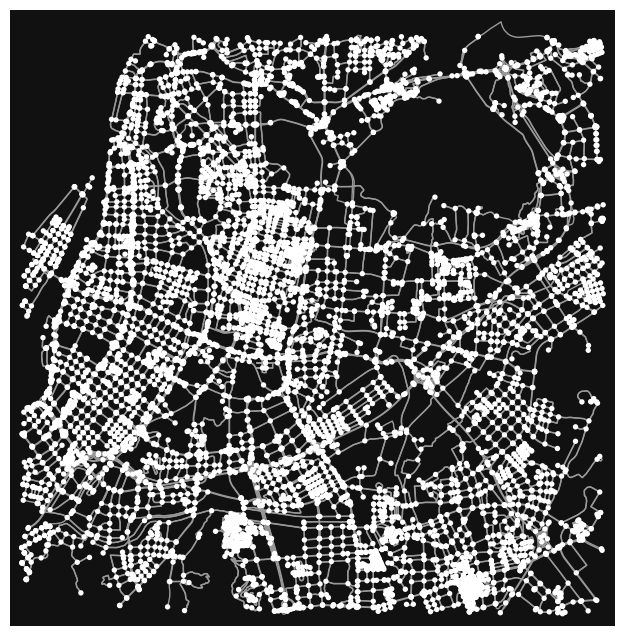

In [6]:
# 框选路网范围，生成图 #

# download/model a street network for some city then visualize it
# north=32.1070, east=118.9061, south=31.9280, west=118.6935 # 378025908km^2, nodes=7849, edges=18262, avg_len=217
# north=32.0849, east=118.8970, south=31.9838, west=118.7183 # 183969058km^2, nodes=3740, edges=8768, avg_len=214
G = ox.graph_from_bbox(north=32.1070, east=118.9061, south=31.9280, west=118.6935 , network_type="drive")
fig, ax = ox.plot_graph(G)

In [15]:
# what sized area does our network cover in square meters?
G_proj = ox.project_graph(G)
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
graph_area_m

378025908.9305696

In [16]:
# show some basic stats about the network
ox.basic_stats(G_proj, area=graph_area_m, clean_int_tol=15)

{'n': 7849,
 'm': 18262,
 'k_avg': 4.653331634603134,
 'edge_length_total': 3962960.3710000035,
 'edge_length_avg': 217.00582471799385,
 'streets_per_node_avg': 3.1200152885717927,
 'streets_per_node_counts': {0: 0,
  1: 769,
  2: 49,
  3: 4597,
  4: 2345,
  5: 85,
  6: 3,
  7: 0,
  8: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.09797426423748248,
  2: 0.006242833481972226,
  3: 0.5856797044209453,
  4: 0.2987641737800994,
  5: 0.010829405019747738,
  6: 0.0003822142948146261,
  7: 0.0,
  8: 0.00012740476493820868},
 'intersection_count': 7080,
 'street_length_total': 2739542.4570000046,
 'street_segment_count': 12121,
 'street_length_avg': 226.01620798614013,
 'circuity_avg': 1.046231787594145,
 'self_loop_proportion': 0.002640046200808514,
 'clean_intersection_count': 5001,
 'node_density_km': 20.76312711529408,
 'intersection_density_km': 18.72887501290382,
 'edge_density_km': 10483.303597394071,
 'street_density_km': 7246.970094589905,
 'clean_intersection_density_km': 13.

In [7]:
# convert your MultiDiGraph to an undirected MultiGraph
M = ox.utils_graph.get_undirected(G)

In [17]:
# show some basic stats about the network
ox.basic_stats(M)

{'n': 7849,
 'm': 12121,
 'k_avg': 3.088546311632055,
 'edge_length_total': 2739542.456999998,
 'edge_length_avg': 226.0162079861396,
 'streets_per_node_avg': 3.1200152885717927,
 'streets_per_node_counts': {0: 0,
  1: 769,
  2: 49,
  3: 4597,
  4: 2345,
  5: 85,
  6: 3,
  7: 0,
  8: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.09797426423748248,
  2: 0.006242833481972226,
  3: 0.5856797044209453,
  4: 0.2987641737800994,
  5: 0.010829405019747738,
  6: 0.0003822142948146261,
  7: 0.0,
  8: 0.00012740476493820868},
 'intersection_count': 7080,
 'street_length_total': 2739542.456999998,
 'street_segment_count': 12121,
 'street_length_avg': 226.0162079861396,
 'circuity_avg': 1.0457988880019906,
 'self_loop_proportion': 0.002640046200808514}

## 8.2 添加边特征

### 8.2.0 POI搜寻，感觉不太方便

In [6]:
# 以点为中心搜周边POI，但是需要自己定义tags #
tags = {'highway': True}
ox.features_from_point((32.03086666666667, 118.8109), tags, dist=50)

highway  \
element_type osmid                       
node         1596449746       bus_stop   
way          89642826    living_street   
             93210849          primary   
             775711268         footway   
             775711269         footway   
             775711270         footway   
             775711271         footway   

                                                                  geometry  \
element_type osmid                                                           
node         1596449746                         POINT (118.81129 32.03119)   
way          89642826    LINESTRING (118.80517 32.03079, 118.80832 32.0...   
             93210849    LINESTRING (118.81114 32.02837, 118.81115 32.0...   
             775711268   LINESTRING (118.81098 32.03101, 118.81104 32.0...   
             775711269   LINESTRING (118.81128 32.03086, 118.81142 32.0...   
             775711270   LINESTRING (118.81104 32.03098, 118.81128 32.0...   
             775711271   LINESTRING (118.81130 32.03385, 118.81128 32.0...   

                         bus  name public_transport source source:name  \
element_type osmid                                                       
node         1596449746  yes    标营         platform    GPS      survey   
way          89642826    NaN  明御河路              NaN    NaN         NaN   
             93210849    NaN   御道街              NaN    NaN         NaN   
             775711268   NaN   NaN              NaN    NaN         NaN   
             775711269   NaN   NaN              NaN    NaN         NaN   
             775711270   NaN   NaN              NaN    NaN         NaN   
             775711271   NaN   NaN              NaN    NaN         NaN   

                                                                     nodes  \
element_type osmid                                                           
node         1596449746                                                NaN   
way          89642826     [1030579415, 1038952013, 4345447289, 7276015852]   
             93210849    [1030570360, 1030579376, 7276015852, 723669065...   
             775711268                            [7236690652, 7236690654]   
             775711269                            [7236690655, 7236690653]   
             775711270                            [7236690654, 7236690655]   
             775711271   [6554954226, 7236690657, 7236690658, 723669065...   

                        lanes oneway   footway bridge layer  
element_type osmid                                           
node         1596449746   NaN    NaN       NaN    NaN   NaN  
way          89642826     NaN    NaN       NaN    NaN   NaN  
             93210849       4     no       NaN    NaN   NaN  
             775711268    NaN    NaN  sidewalk    NaN   NaN  
             775711269    NaN    NaN  sidewalk    NaN   NaN  
             775711270    NaN    NaN  sidewalk    yes     1  
             775711271    NaN    NaN  sidewalk    NaN   NaN

### 8.2.1 对应路网信息录入

In [ ]:
# 获取所有mob readings所在的最近的边，注意G是原始的有向图，没有统计到相遇情况，改成用M无向图
nearest_edges = []
for i in range(vehicle_n):
    nearest_edges.append(ox.nearest_edges(M, mob[i].lon, mob[i].lat)) # return：（u, v, key）
# mob[0][mob[0].time > '2022-11-01']

In [8]:
# 仅靠ref单条最近的边，无法创造任何相遇，所以不执行这一条！！！ #
# 获取所有ref所在的最近的边，注意G是原始的有向图，没有统计到相遇情况，改成用M无向图
# nearest_edges_ref = []
# for i in range(refer_n):
#     nearest_edges_ref.append(ox.nearest_edges(M, ref[i].lon, ref[i].lat)) # return：（u, b, key）

In [127]:
list([nearest_edges_ref_test[0]])

[(2000379666, 3163967620, 0)]

In [7]:
# 所有边对应的highway类型 #
roadType = [ [] for _ in range(vehicle_n)] # 有些路的同一个tags有多个属性
cnt = 0
for edge_list in nearest_edges:
    for edge in edge_list:
        if isinstance(G.edges[edge]['highway'], list): # 多个属性的只选择第一个
            roadType[cnt].append(G.edges[edge]['highway'][0]) 
        else:
            roadType[cnt].append(G.edges[edge]['highway'])
    cnt += 1


In [ ]:
# mob 数据中加入新属性 #
for i in range(vehicle_n):
    # mob[i]['roadtype'] = roadType[i]
    mob[i]['street'] = nearest_edges[i]


In [9]:
# ref 数据中加入新属性 #
for i in range(refer_n):
    ref[i]['street'] = nearest_edges_ref[i]
    ref[i] = ref[i].reset_index()

In [ ]:
# 获取 ref 为中心，周边任意距离的边 #
# 取200m，所有11个ref都有链接的路网；100m，只有7个ref；#
gdf_edges = []
for i in range(refer_n):
    try:
        G_ref = ox.graph.graph_from_point((ref[i].iloc[0]['lat'], ref[i].iloc[0]['lon']), dist=100, network_type="drive", retain_all=True, truncate_by_edge=True)
    except ValueError:
        continue

    G_ref = ox.utils_graph.get_undirected(G_ref)
    gdf_edges.append(ox.graph_to_gdfs(G_ref, nodes=False))
    gdf_edges[-1]['num']= i

In [86]:
len(gdf_edges)

7

因为以上的无向图单边也无法满足mob和ref的相遇，所以每个ref都圈出了方圆200的道路作为自己的覆盖范围

In [ ]:
# 聚合起来方便下面可视化和后续操作 #
gdf_edges_tot = pd.concat(gdf_edges) # , keys=[i for i in range(refer_n)]

In [93]:
gdf_edges_tot

osmid  name        highway  \
u          v           key                                                 
1068751026 1068751034  0                   92187716   玉兰路      secondary   
           3163967622  0                   99661590  雨花南路        primary   
           3163967621  0                   99661590  雨花南路        primary   
771184498  1038854215  0                  147399827   洪武路      secondary   
1038854215 1155831131  0                   89637250  游府西街    residential   
           10951736053 0                  147399827   洪武路      secondary   
4219267484 9308122931  0                  422206231   光华路        primary   
           9609170518  0                 1008820434  承天大道        primary   
           4219268195  0                  779232496   光华路        primary   
           9308122932  0                 1008820434  承天大道        primary   
4219268252 9308122931  0                  422206231   光华路        primary   
4219268302 9308122932  0                  137385977   光华路        primary   
           9308122931  0                 1008820433  承天大道        primary   
7232707224 9609170518  0    [1008820434, 664164365]  承天大道        primary   
7232707225 9609170511  0    [1008820433, 664164366]  承天大道        primary   
9308122931 9609170511  0                 1008820433  承天大道        primary   
9609170511 9609170518  0                 1044280133   NaN       tertiary   
1038850156 1038850173  0                   61877415   淮海路    residential   
1038850173 2153973722  0                  423287196  太平南路   unclassified   
           1038854203  0                  423287196  太平南路   unclassified   
2153973719 3245923040  0                  205422092  三十四标    residential   
           2153973722  0                  205422093   杨公井    residential   
2153973733 3245923040  0                  205422092  三十四标    residential   
3245923040 3245923046  0                  318197092   NaN    residential   
1068742519 3303995510  0                   91996898   锦绣坊  living_street   
1068742569 3303995510  0                   91996898   锦绣坊  living_street   
1303009421 3303995510  0                  115255916   NaN  living_street   
1303009423 3303995510  0                  115255916   NaN  living_street   
770253072  1038952011  0                   93210849   御道街        primary   
1030579376 7276015852  0                   93210849   御道街        primary   
1038951985 1038952011  0                   89642825    标营  living_street   
1038952011 7276015852  0                   93210849   御道街        primary   
1038952013 7276015852  0                   89642826  明御河路  living_street   
1038878554 2593674862  0                   89638618   秦虹路       tertiary   
1166144215 2593674862  0                 1061066508   大明路        primary   
           1474897497  0                  444876316   大明路        primary   
1474897497 2593674862  0                   89638618   秦虹路       tertiary   
           1474897534  0                  134104483   NaN  living_street   
           1474897546  0                  444876316   大明路        primary   
2593674861 2593674862  0                 1061066508   大明路        primary   

                            oneway  reversed   length  \
u          v           key                              
1068751026 1068751034  0     False      True  399.240   
           3163967622  0      True     False  217.436   
           3163967621  0      True     False  127.630   
771184498  1038854215  0     False      True  184.700   
1038854215 1155831131  0     False     False  127.058   
           10951736053 0     False      True  268.033   
4219267484 9308122931  0      True     False   13.147   
           9609170518  0      True     False  107.551   
           4219268195  0      True     False  293.637   
           9308122932  0      True     False   11.642   
4219268252 9308122931  0      True     False  188.313   
4219268302 9308122932  0      True     False   12.677   
           9308122931  0      True     False   10.557  

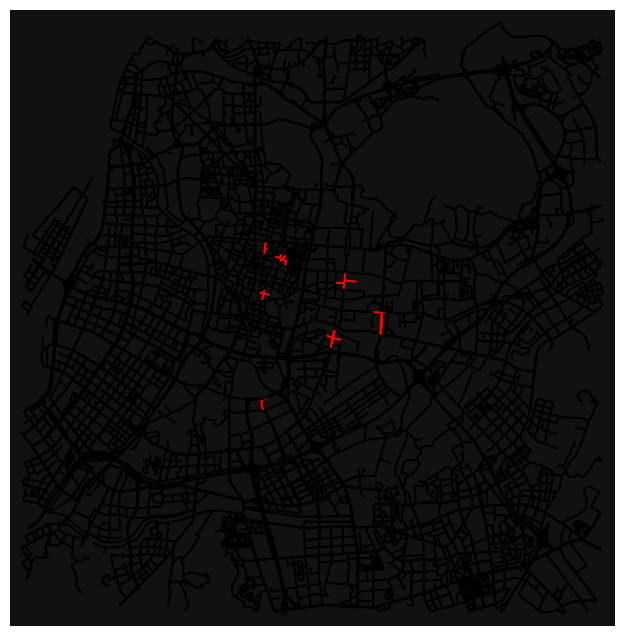

In [94]:
# 可视化选中边 #
# 如果是列表判断需要用 in，具体的 tuple 就用 == #
ec = ["red" if (u, v, k) in gdf_edges_tot.index else "black" for u, v, k in M.edges(keys=True)]
    
fig, ax = ox.plot_graph(M, node_size=0, edge_color=ec, edge_linewidth=1.5)

### 8.2.2 全部移动LCS测量的道路级平均污染分析（可时间切片分析）

In [407]:
# 各类型highway数据条目数, 对应的平均污染都很接近，完全不能说明什么 # 
from collections import Counter

count_dict = Counter()
for i in range(vehicle_n):
    for item in roadType[i]:
        if isinstance(item, list):
            count_dict.update(item)
        else:
            count_dict[item] += 1

print(count_dict)



Counter({'tertiary': 718472, 'residential': 357609, 'secondary': 355598, 'primary': 330045, 'living_street': 207288, 'unclassified': 177661, 'trunk_link': 42551, 'trunk': 25685, 'primary_link': 6914, 'motorway': 4099, 'tertiary_link': 3228, 'secondary_link': 3030, 'motorway_link': 1889})


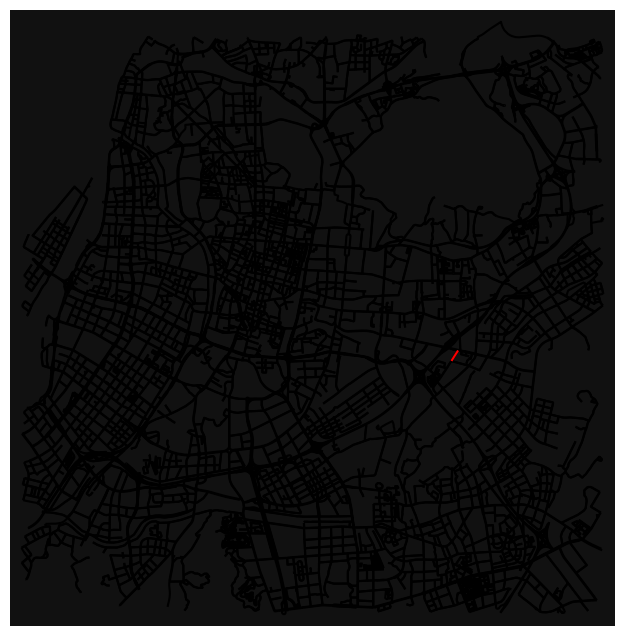

In [22]:
# 可视化选中边 #
# 如果是列表判断需要用 in，具体的 tuple 就用 == #
ec = ["red" if (u, v, k) == (3316780336, 7801533398, 0) else "black" for u, v, k in G.edges(keys=True)]
    
fig, ax = ox.plot_graph(G, node_size=0, edge_color=ec, edge_linewidth=1.5)

In [12]:
# 合并所有mob的df，便于后续处理 #
mob_tot = pd.concat(mob, keys=[i for i in range(vehicle_n)])
mob_tot

time      pm2d5        lat         lon        tmp  \
0  325     2022-04-01 05:25:00  31.962222  31.997640  118.741550   8.511111   
   326     2022-04-01 05:26:00  32.816500  31.997640  118.741550   8.810500   
   327     2022-04-01 05:27:00  32.733500  31.997650  118.741548   9.143500   
   328     2022-04-01 05:28:00  32.482222  31.997713  118.741501   9.396667   
   329     2022-04-01 05:29:00  32.066000  31.997512  118.741562   9.694000   
...                        ...        ...        ...         ...        ...   
21 351362  2022-11-30 23:55:00   5.217000  32.012685  118.761663  18.619500   
   351363  2022-11-30 23:56:00   5.883000  32.012699  118.761680  19.160000   
   351364  2022-11-30 23:57:00   7.849500  32.012719  118.761672  19.684500   
   351365  2022-11-30 23:58:00   9.533500  32.012683  118.761624  20.207000   
   351366  2022-11-30 23:59:00   7.157500  32.012669  118.761608  20.723000   

                 hmd      roadtype                       street  
0  325     31.985556  unclassified  (9462016592, 9462016591, 0)  
   326     34.674500  unclassified  (9462016592, 9462016591, 0)  
   327     36.582500  unclassified  (9462016591, 9462016592, 0)  
   328     37.433333  unclassified  (9462016591, 9462016592, 0)  
   329     38.002000  unclassified  (9462016591, 9462016592, 0)  
...              ...           ...                          ...  
21 351362  46.149500       primary   (7801326982, 430616359, 0)  
   351363  45.238000       primary   (7801326982, 430616359, 0)  
   351364  44.480000       primary   (7801326982, 430616359, 0)  
   351365  43.799000       primary   (7801326982, 430616359, 0)  
   351366  43.152000       primary   (7801326982, 430616359, 0)  

[2234069 rows x 8 columns]

In [29]:
mob_tot.to_csv('./mob_tot.csv')

In [13]:
# 计算街道平均值
# 11-18～11-19 的图比较明显
avg_by_category = mob_tot[(mob_tot.time > '2022-11-18') & (mob_tot.time< '2022-11-19')].groupby('street')['pm2d5'].mean()
print(avg_by_category)


street
(304815377, 770095460, 0)        36.878000
(304815377, 2602977729, 0)       38.961500
(305194317, 10303904930, 0)      24.443889
(305194877, 1038878507, 0)       19.750500
(305194877, 3305890111, 0)       22.750000
                                   ...    
(10951736055, 10951736056, 0)    53.389724
(10951736056, 2327839069, 0)     53.214737
(10951736056, 10800535792, 0)    48.438832
(10951736058, 7284423258, 0)     52.987500
(10991405830, 10991405821, 0)    43.699500
Name: pm2d5, Length: 1029, dtype: float64


(40, 60]      603
(20, 40]      363
(0, 20]        50
(60, 80]        2
(80, 100]       0
(100, 150]      0
(150, 200]      0
Name: pm2d5, dtype: int64


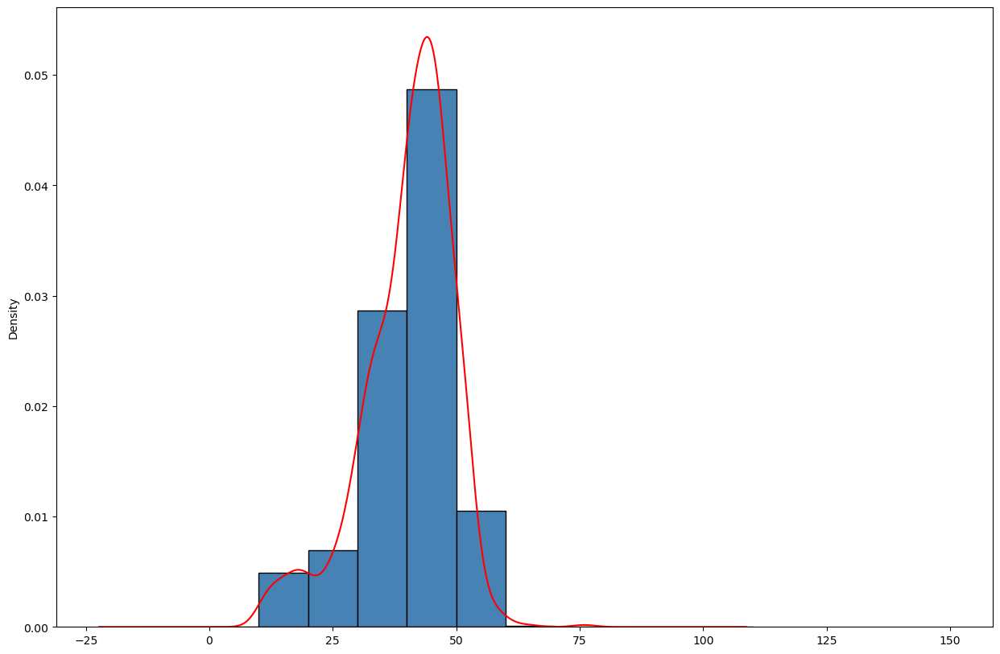

In [88]:
## 测量物浓度范围分布##
plt.figure(figsize=(15,10))
plt.hist(avg_by_category, bins=[0,10,20,30,40,50,60,70, 100, 150], width=10, align='mid', color="steelblue",edgecolor="black", density=True)
avg_by_category.plot(kind="kde",color="red",label="核密度图")

se1 = pd.cut(avg_by_category, [0,20,40,60,80,100,150,200]) # 统计各个区间的数值数量
print(se1.value_counts())


In [14]:
# Calculate the standard deviation by category
std_by_category = mob[12].groupby('street')['pm2d5'].std()
print(std_by_category)

street
(304815377, 770095460, 0)              NaN
(304815377, 2602977729, 0)             NaN
(304815388, 3163967624, 0)             NaN
(305194264, 305194258, 0)         0.447245
(305194271, 2000431288, 0)       16.020176
                                   ...    
(10302314468, 1038851723, 0)           NaN
(10302314468, 10302314465, 0)          NaN
(10686646935, 770253611, 0)       7.825551
(10686646935, 4219267438, 0)     13.108142
(10917702181, 4414643315, 0)     52.319300
Name: pm2d5, Length: 705, dtype: float64


In [15]:
# 将图的点和边提取成gdf #
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [16]:
# 把各路段的pm2.5数值加入edge_attr #
gdf_edges['pm2d5'] = avg_by_category
# nx.set_edge_attributes(G, avg_by_category, "pm2d5") # 虽然能直接加入特征，但是na值还是得转成gdf处理！

In [17]:
# 处理na值 #
gdf_edges.pm2d5 = gdf_edges.pm2d5.fillna(1)
gdf_edges

osmid oneway lanes  name         highway  \
u           v           key                                                  
29571639    4226753211  0      52458715   True     2   山西路       secondary   
            4631597350  0     142846710   True     3  中山北路         primary   
29571641    1038241973  0      62352731  False   NaN  云南北路        tertiary   
            3239093499  0    1059174744  False   NaN   云南路        tertiary   
            4226753249  0     142846710   True     3  中山北路         primary   
...                                 ...    ...   ...   ...             ...   
11053235660 11053235658 0    1190420563  False   NaN   NaN  secondary_link   
            11053235647 0    1190420560  False   NaN   NaN    primary_link   
11055875765 11051192473 0     759990840   True     2   同夏路       secondary   
            11055875773 0    1190730931   True   NaN   NaN    primary_link   
11055875773 4227473444  0     917396469   True     3  天印大道         primary   

                            reversed   length  \
u           v           key                     
29571639    4226753211  0      False    8.190   
            4631597350  0      False  263.549   
29571641    1038241973  0      False  160.196   
            3239093499  0       True    8.275   
            4226753249  0      False  596.014   
...                              ...      ...   
11053235660 11053235658 0       True   43.418   
            11053235647 0      False   32.401   
11055875765 11051192473 0      False   83.338   
            11055875773 0      False   83.093   
11055875773 4227473444  0      False  349.803   

                                                                      geometry  \
u           v           key                                                      
29571639    4226753211  0    LINESTRING (118.76777 32.07072, 118.76771 32.0...   
            4631597350  0    LINESTRING (118.76777 32.07072, 118.76727 32.0...   
29571641    1038241973  0    LINESTRING (118.77225 32.06677, 118.77348 32.0...   
            3239093499  0    LINESTRING (118.77225 32.06677, 118.77219 32.0...   
            4226753249  0    LINESTRING (118.77225 32.06677, 118.76927 32.0...   
...                                                                        ...   
11053235660 11053235658 0    LINESTRING (118.85192 31.93774, 118.85146 31.9...   
            11053235647 0    LINESTRING (118.85192 31.93774, 118.85197 31.9...   
11055875765 11051192473 0    LINESTRING (118.85561 31.95731, 118.85515 31.9...   
            11055875773 0    LINESTRING (118.85561 31.95731, 118.85547 31.9...   
11055875773 4227473444  0    LINESTRING (118.85488 31.95727, 118.85358 31.9...   

                            bridge maxspeed  ref junction access tunnel width  \
u           v           key                                                     
29571639    4226753211  0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
            4631597350  0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
29571641    1038241973  0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
            3239093499  0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
            4226753249  0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
...                            ...      ...  ...      ...    ...    ...   ...   
11053235660 11053235658 0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
            11053235647 0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
11055875765 11051192473 0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
            11055875773 0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   
11055875773 4227473444  0      NaN      NaN  NaN      NaN    NaN    NaN   NaN   

                             pm2d5  
u           v           key         
29571639    4226753211  0      NaN  
            4631597350  0      NaN  
29571641    1038241973  0      NaN  
            3239093499  0      NaN  
            4226753249  0      NaN  
.

In [18]:
# 重新从gdf转回图 #
G = ox.utils_graph.graph_from_gdfs(gdf_nodes, gdf_edges)


In [19]:
# 根据特征数值得到edge color #
ec = ox.plot.get_edge_colors_by_attr(G, 'pm2d5', cmap='RdYlGn_r', na_color="white") # na_color not useful!!!
ec

3999186863   5753152703   0    (0.6460592079969244, 0.8488273740868897, 0.415...
2602977677   1559404353   0    (0.8860438292964246, 0.9520184544405998, 0.593...
304815377    770095460    0    (0.9853902345251826, 0.9938485198000769, 0.729...
             2602977729   0    (0.9988465974625145, 0.9642445213379469, 0.689...
305194317    10303904930  0    (0.5476355247981546, 0.8057670126874279, 0.404...
                                                     ...                        
10095328586  9751790473   0    (0.27143406382160723, 0.6785851595540178, 0.35...
10858156058  4219129241   0    (0.9943867743175702, 0.7938485198000771, 0.474...
             7276462398   0    (0.9959246443675509, 0.8707420222991157, 0.538...
10303904934  10303904971  0    (0.30649750096116896, 0.6956555171088044, 0.36...
10798822030  1038873352   0    (0.9637831603229527, 0.47743175701653207, 0.28...
Length: 1029, dtype: object

In [142]:
# 批量处理na color（已全部转为1）， 因为上述方法失灵，需要手动处理 #
ec0 = ec.iloc[0] # 根据colormap改变，基本上大概率第一条路都是na
for i in range(len(ec)):
    if ec.iloc[i] == ec0: # 根据colormap改变
        ec.iloc[i] = 'white'
ec

29571639     4226753211   0    white
             4631597350   0    white
4226753211   4226753245   0    white
             1067122974   0    white
4631597350   1067135907   0    white
                               ...  
11050334140  11050334132  0    white
             11050327895  0    white
             11050334134  0    white
11050334132  11050334140  0    white
11050334134  11050334140  0    white
Length: 18262, dtype: object

In [95]:
# 生成colorbar #
import matplotlib as mpl

cmap = plt.colormaps.get_cmap('RdYlGn_r')
norm=plt.Normalize(vmin=gdf_edges['pm2d5'].min(), vmax=gdf_edges['pm2d5'].max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])


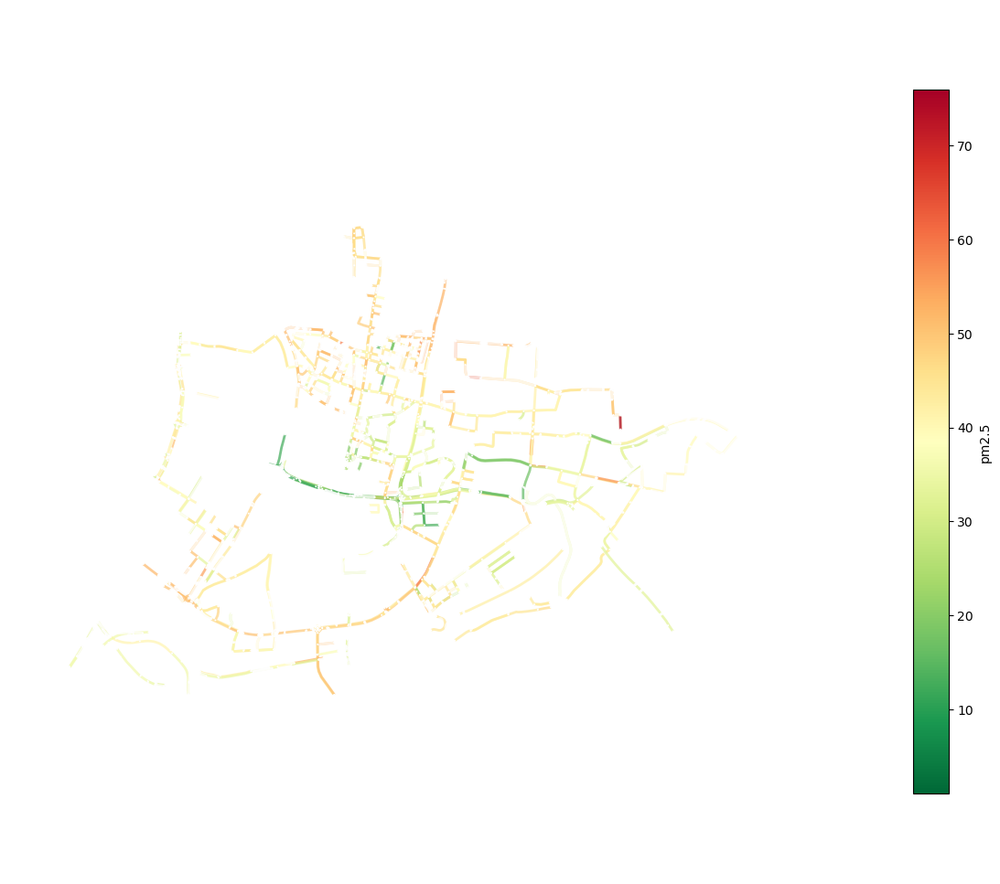

In [143]:
# 可视化街道平均污染图 #
fig, ax = ox.plot_graph(G, bgcolor='white', figsize=(15, 20), node_size=0, edge_color=ec, edge_linewidth=2, edge_alpha=0.7, dpi=1000, show=False) # 不能默认show，不然色轴无法生效
cb = fig.colorbar(sm, ax=ax, shrink=0.5, orientation='vertical')
cb.set_label('pm2.5', fontsize = 10)

fig.show()

## 8.3 道路级误差对比（已预存pkl数据可执行）

### 8.3.1找出所有相遇

In [ ]:
# 如果 ref 之前 bfill 了的话，需要重置下index #
for i in range(refer_n):
    ref[i] = ref[i].reset_index()

In [ ]:
for i in range(vehicle_n):
    mob[i]['ref_pm2d5'] = pd.Series()

In [ ]:
# 遍历每一条mob数据，去匹配是否在ref路网的覆盖范围里 #
mob_ref_rndzvs = [[] for _ in range(vehicle_n)]

for i in range(vehicle_n):    
    for j in range(len(mob[i])): 
        if mob[i].iloc[j].street in gdf_edges_tot.index:
            k = list(gdf_edges_tot[gdf_edges_tot.index == mob[i].iloc[j].street].num)[0]
            # if mob[i].iloc[j].time in ref[k].time: # ref.time 是timestamp类型，而mob[i]是普通的字符串，无法直接判断！！
            if pd.to_datetime(mob[i].iloc[j].time) in ref[k].time.values:
                tmp = mob[i].iloc[j]
                tmp['ref_pm2d5'] = ref[k][ref[k].time == mob[i].iloc[j].time].pm2d5.squeeze()
                mob_ref_rndzvs[i].append(tmp)



/tmp/ipykernel_9551/3410727328.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [104]:
len(mob_ref_rndzvs[10])

877

In [119]:
rndzvs_df = []
for i in range(vehicle_n):
    rndzvs_df.append(pd.DataFrame(mob_ref_rndzvs[i]))
    if len(mob_ref_rndzvs[i]):
        rndzvs_df[i]['error'] = abs(rndzvs_df[i].ref_pm2d5.squeeze() - rndzvs_df[i].pm2d5.squeeze())
    else:
        rndzvs_df[i]['time'] = None
        rndzvs_df[i]['error'] = None

In [ ]:
rndzvs_df[6]

,time,error


### (deprecated) 古法groupby，mob之间的相遇方便使用，但对于覆盖多条边的ref不好使，得使用上述的方法！

In [14]:
# 需要合并mob和ref #
mob_tot = pd.concat(mob, keys=[i for i in range(vehicle_n)])
ref_tot = pd.concat(ref, keys=[i for i in range(refer_n)])
mob_ref = pd.concat([mob_tot, ref_tot], keys=['mob', 'ref'])


In [20]:
# 直接读取即可 #
# mob_ref.to_pickle('mob_ref.pkl')
mob_ref = pd.read_pickle('mob_ref.pkl')

In [36]:
mob_ref

time      pm2d5        lat         lon  \
mob 0  325     2022-04-01 05:25:00  31.962222  31.997640  118.741550   
       326     2022-04-01 05:26:00  32.816500  31.997640  118.741550   
       327     2022-04-01 05:27:00  32.733500  31.997650  118.741548   
       328     2022-04-01 05:28:00  32.482222  31.997713  118.741501   
       329     2022-04-01 05:29:00  32.066000  31.997512  118.741562   
...                            ...        ...        ...         ...   
ref 11 351341  2022-11-30 23:51:00  11.014000  32.013056  118.807500   
       351342  2022-11-30 23:52:00  11.014000  32.013056  118.807500   
       351343  2022-11-30 23:53:00  11.014000  32.013056  118.807500   
       351344  2022-11-30 23:54:00  11.014000  32.013056  118.807500   
       351345  2022-11-30 23:55:00  11.014000  32.013056  118.807500   

                    tmp        hmd                       street  
mob 0  325     8.511111  31.985556  (9462016591, 9462016592, 0)  
       326     8.810500  34.674500  (9462016591, 9462016592, 0)  
       327     9.143500  36.582500  (9462016591, 9462016592, 0)  
       328     9.396667  37.433333  (9462016591, 9462016592, 0)  
       329     9.694000  38.002000  (9462016591, 9462016592, 0)  
...                 ...        ...                          ...  
ref 11 351341       NaN        NaN  (1474897497, 1474897546, 0)  
       351342       NaN        NaN  (1474897497, 1474897546, 0)  
       351343       NaN        NaN  (1474897497, 1474897546, 0)  
       351344       NaN        NaN  (1474897497, 1474897546, 0)  
       351345       NaN        NaN  (1474897497, 1474897546, 0)  

[6450116 rows x 7 columns]

In [26]:
# 按街道groupby #
mob_ref_road = mob_ref.groupby(['street', 'time']) # [(mob_tot.time > '2022-06-22') & (mob_tot.time< '2022-11-23')]

In [ ]:
# 别忘了取出真正相遇的分组，len(mob_ref_road)有650w+，之所以那么大，说明相遇的可能性小，所以很多group都是单条数据，所以逼近总量
rendezvous = []
for i in mob_ref_road:        
    if i[1].shape[0] > 1:
        rendezvous.append(i[1])

In [29]:
import pickle

# with open('mob_ref_road.pkl', 'wb') as f:
#     pickle.dump(rendezvous, f)

with open('mob_ref_road.pkl', 'rb') as f:
    rendezvous = pickle.load(f)


In [31]:
## 分车号各自统计相遇数据 ##
vehicle_n = 22
static_n = 21
refer_n = 12


mob_rendezvous = [[] for _ in range(vehicle_n)] 

for i in rendezvous:
    for j in i.index:
        if j[0] == 'mob':
            mob_rendezvous[j[1]].append(i)

In [32]:
for i in range(vehicle_n):
    print(len(mob_rendezvous[i]))

18735
13844
18984
19356
10694
15748
11151
11296
11472
4876
11670
13666
13201
11500
11750
11700
12651
13435
11196
11319
13120
14484


In [33]:
rendezvous[0]

time      pm2d5        lat         lon  \
mob 9  320238  2022-11-09 09:11:00  52.701579  32.014082  118.791997   
    13 320238  2022-11-09 09:11:00  46.233500  32.013474  118.791828   

                     tmp        hmd                      street  
mob 9  320238  18.652632  66.667895  (304815377, 2602977729, 0)  
    13 320238  26.600000  47.665000  (304815377, 2602977729, 0)

### 计算误差画图 (从这里可直接读取相遇信息)

In [5]:
import pickle
# 写入文件
# with open('rndzvs_df_100m.pkl', 'wb') as file:
#     pickle.dump(rndzvs_df, file)

# 读取文件
vehicle_n = 22
rndzvs_df = []
with open('rndzvs_df_200m.pkl', 'rb') as file:
    rndzvs_df = pickle.load(file)

In [4]:
for i in range(vehicle_n):
    rndzvs_df[i].time = pd.to_datetime(rndzvs_df[i].time)
    rndzvs_df[i].set_index('time', inplace=True)

NameError: name 'vehicle_n' is not defined

In [19]:
rndzvs_df[0]

,pm2d5,lat,lon,tmp,hmd,street,ref_pm2d5,error
time,,,,,,,,
2022-04-01 06:51:00,37.033500,32.026038,118.779830,14.501500,36.103500,"(1068742569, 4420129292, 0)",37.418,0.384500
2022-04-01 06:52:00,37.766500,32.029778,118.780759,14.558500,35.945000,"(3303988132, 4414643356, 0)",37.418,0.348500
2022-04-01 06:55:00,36.367000,32.038357,118.782135,14.698500,35.347000,"(771184498, 4415893516, 0)",24.505,11.862000
2022-04-01 06:56:00,36.500000,32.042450,118.782726,14.701500,35.290500,"(1038854215, 10951736053, 0)",25.173,11.327000
2022-04-01 07:19:00,37.533000,32.041940,118.782551,15.601500,33.806500,"(1038854215, 10951736053, 0)",27.844,9.689000
...,...,...,...,...,...,...,...,...
2022-11-30 14:09:00,25.108500,32.040787,118.782406,17.592500,14.455500,"(771184498, 1038854215, 0)",14.334,10.774500
2022-11-30 14:39:00,27.281053,32.041989,118.782480,17.648947,14.768421,"(1038854215, 10951736053, 0)",15.906,11.375053
2022-11-30 14:40:00,18.729375,32.039121,118.782144,17.681250,14.636875,"(771184498, 4415893516, 0)",15.906,2.823375


In [20]:
## 单图绘制 ##
import plotly.graph_objects as go
from plotly_resampler import register_plotly_resampler

register_plotly_resampler(mode='auto')

# Create data for the line/Scatter trace

## 单图绘制 LCS 选择
lcs_num = 3
x_lcs = rndzvs_df[lcs_num].index
y_lcs = rndzvs_df[lcs_num].pm2d5
x_error = rndzvs_df[lcs_num].index
y_error = rndzvs_df[lcs_num].error
x_ref = rndzvs_df[lcs_num].index
y_ref = rndzvs_df[lcs_num].ref_pm2d5


fig = go.Figure()


# Add both traces to the same axes
fig.add_trace(go.Scatter(x=x_lcs, y=y_lcs, mode='markers', name='lcs', hovertext=x_lcs))
fig.add_trace(go.Scatter(x=x_error, y=y_error, mode='lines+markers', name='{} entries'.format(len(x_lcs))))
fig.add_trace(go.Scatter(x=x_ref, y=y_ref, mode='markers', name='ref'))

# Update the layout if needed
fig.update_layout(title='LCS {} error trend'.format(lcs_num),
                  xaxis_title='time',
                  yaxis_title='concentration')

# Show the figure
fig
# fig.write_html('MLCS路网级相遇误差.html')

FigureWidgetResampler({
    'data': [{'hovertext': array([datetime.datetime(2022, 4, 1, 7, 0),
                                  datetime.datetime(2022, 4, 1, 7, 36),
                                  datetime.datetime(2022, 4, 1, 9, 43), ...,
                                  datetime.datetime(2022, 11, 16, 9, 23),
                                  datetime.datetime(2022, 11, 16, 11, 47),
                                  datetime.datetime(2022, 11, 16, 12, 19)], dtype=object),
              'mode': 'markers',
              'name': '<b style="color:sandybrown">[R]</b> lcs <i style="color:#fc9944">~6h</i>',
              'type': 'scatter',
              'uid': 'b52a062f-1950-4669-a6f2-2f38e5acd709',
              'x': array([datetime.datetime(2022, 4, 1, 7, 0),
                          datetime.datetime(2022, 4, 1, 7, 36),
                          datetime.datetime(2022, 4, 1, 9, 43), ...,
                          datetime.datetime(2022, 11, 16, 9, 23),
                          dat

In [21]:
## (多子图多LCS) 所有 mob LCS 与 ref-{100~200}m内覆盖路网 相遇的统计误差
import plotly.graph_objs as go
from plotly.subplots import make_subplots

register_plotly_resampler(mode='auto')
# create a figure with two subplots
fig = make_subplots(rows=11, cols=2)

# add a scatter plot to the first subplot
for i in range(vehicle_n):
    # x_error = rndzvs_df[i].resample('D').mean(numeric_only=True).index 
    # y_error = rndzvs_df[i].resample('D').mean(numeric_only=True)['error']
    x_error = rndzvs_df[i].index
    y_error = rndzvs_df[i]['error']
    fig.add_trace(go.Scatter(x=x_error, y=y_error, mode='lines+markers', name='error # ' + str(i)),
                  row=i//2 + 1, col= i%2 + 1)
    # fig.add_trace(go.Scatter(x=x_ref, y=y_ref, mode='lines+markers', name='ref'),
    #               row=i//2 + 1, col= i%2 + 1,)
    # fig.add_trace(go.Scatter(x=x_lcs, y=y_lcs, mode='lines+markers', name='lcs'), 
    #               row=i//2 + 1, col= i%2 + 1)



# update the layout
fig.update_layout(title='Error trend of all LCS with ref',
                  height=2000,
                  )

# show the figure
fig.show()
fig.write_html('mob_ref-200m-DayResample.html')

区间值评估，误差在10%内为正常波动，筛选出大于此标准的相遇误差点

In [6]:
# 计算误差百分比

for i in range(vehicle_n):
    rndzvs_df[i]['error_%'] = abs(rndzvs_df[i]['error']) / rndzvs_df[i]['ref_pm2d5']

In [7]:
# 所有车的平均误差，不同程度误差的样本占比 #
err_prcnt = 0.1
err_abs = 10
for i in range(vehicle_n):
    error_10 = len(rndzvs_df[i][rndzvs_df[i]['error_%'] > err_prcnt])
    error_tot = len(rndzvs_df[i])
    print('lcs{}: {}'.format(i, rndzvs_df[i].mean(numeric_only=True)['error']) +
           ', and {}/{} ({}%) points have {}% more error'.format(error_10, error_tot, int(error_10/error_tot * 100), err_prcnt * 100) +
           ', and {}/{} ({}%) points have {} more error'.format(len(rndzvs_df[i][rndzvs_df[i]['error'] > err_abs] ),
                                                                 error_tot, int(len(rndzvs_df[i][rndzvs_df[i]['error'] > err_abs])/error_tot * 100), err_abs)
           )
    


lcs0: 9.869517743822865, and 4488/5454 (82%) points have 10.0% more error, and 2102/5454 (38%) points have 10 more error
lcs1: 8.301137689063523, and 3330/3968 (83%) points have 10.0% more error, and 1298/3968 (32%) points have 10 more error
lcs2: 8.807774041098073, and 4335/5306 (81%) points have 10.0% more error, and 1815/5306 (34%) points have 10 more error
lcs3: 9.040291117144106, and 4809/5882 (81%) points have 10.0% more error, and 2188/5882 (37%) points have 10 more error
lcs4: 12.81808166260012, and 1685/1889 (89%) points have 10.0% more error, and 1037/1889 (54%) points have 10 more error
lcs5: 14.031947699517778, and 905/979 (92%) points have 10.0% more error, and 569/979 (58%) points have 10 more error
lcs6: 23.09347898624614, and 27/27 (100%) points have 10.0% more error, and 27/27 (100%) points have 10 more error
lcs7: 18.57131236097166, and 209/211 (99%) points have 10.0% more error, and 159/211 (75%) points have 10 more error
lcs8: 12.109065685450897, and 4866/5268 (92%)

In [58]:
for i in range(vehicle_n):
    print('lcs{} label rate: {}/{}, {:.2f}%'.format(i, len(rndzvs_df[i]), len(mob[i]), len(rndzvs_df[i])/len(mob[i])*100))

lcs0 label rate: 5454/106015, 5.14%
lcs1 label rate: 3968/110417, 3.59%
lcs2 label rate: 5306/114541, 4.63%
lcs3 label rate: 5882/113311, 5.19%
lcs4 label rate: 1889/116484, 1.62%
lcs5 label rate: 979/76526, 1.28%
lcs6 label rate: 27/11180, 0.24%
lcs7 label rate: 211/160584, 0.13%
lcs8 label rate: 5268/64899, 8.12%
lcs9 label rate: 915/52723, 1.74%
lcs10 label rate: 7163/101960, 7.03%
lcs11 label rate: 7437/232950, 3.19%
lcs12 label rate: 33849/197173, 17.17%
lcs13 label rate: 5957/88688, 6.72%
lcs14 label rate: 1415/41775, 3.39%
lcs15 label rate: 1245/34684, 3.59%
lcs16 label rate: 8863/142995, 6.20%
lcs17 label rate: 1049/174109, 0.60%
lcs18 label rate: 575/68558, 0.84%
lcs19 label rate: 10568/54394, 19.43%
lcs20 label rate: 2782/68848, 4.04%
lcs21 label rate: 964/101255, 0.95%


### 分时段统计，和网格化的结果相差不大

In [59]:
# 各时段的误差汇总 #


start_time1 = '07:00:00' # 第1个限定时段的开始时间
end_time1 = '10:00:00' # 第1个限定时段的结束时间 
start_time2 = '10:00:00' # 第2个限定时段的开始时间 
end_time2 = '16:00:00' # 第2个限定时段的开始时间 
start_time3 = '16:00:00' # 第3个限定时段的开始时间 
end_time3 = '19:00:00' # 第3个限定时段的开始时间 
start_time4 = '19:00:00' # 第4个限定时段的开始时间 
end_time4 = '23:00:00' # 第4个限定时段的开始时间 
start_time5 = '23:00:00' # 第5个限定时段的开始时间 
end_time5 = '7:00:00' # 第5个限定时段的开始时间 

df1 = []
df2 = []
df3 = []
df4 = []
df5 = []
 
for i in range(vehicle_n):
    df1.append(rndzvs_df[i].between_time(start_time1, end_time1).error) # 筛选第一个限定时段
    df2.append(rndzvs_df[i].between_time(start_time2, end_time2).error) # 筛选第二个限定时段
    df3.append(rndzvs_df[i].between_time(start_time3, end_time3).error) # 筛选第3个限定时段 
    df4.append(rndzvs_df[i].between_time(start_time4, end_time4).error) # 筛选第4个限定时段 
    df5.append(rndzvs_df[i].between_time(start_time5, end_time5).error) # 筛选第4个限定时段 

df1_concat = pd.concat(df1)
df2_concat = pd.concat(df2)
df3_concat = pd.concat(df3)
df4_concat = pd.concat(df4)
df5_concat = pd.concat(df5)
print(df1_concat.mean(), df2_concat.mean(), df3_concat.mean(), df4_concat.mean(), df5_concat.mean())

13.415595331599855 9.256471385558164 8.819577452545174 9.381562693603152 11.505692661156909


In [58]:
rndzvs_df[i].between_time(start_time1, end_time1)

,pm2d5,lat,lon,tmp,hmd,street,ref_pm2d5,error
time,,,,,,,,
2022-04-05 09:00:00,42.958125,32.009844,118.866331,17.881250,48.300,"(5577962617, 9260279965, 0)",31.836,11.122125
2022-04-05 09:03:00,43.500000,32.009795,118.866115,18.100000,48.365,"(5577962617, 9260279965, 0)",24.600,18.900000
2022-04-05 09:30:00,44.534000,32.009846,118.866024,17.166000,47.062,"(5577962617, 9260279965, 0)",32.158,12.376000
2022-04-05 09:31:00,44.713810,32.009855,118.865288,17.422857,47.890,"(5577962617, 9260279965, 0)",34.626,10.087810
2022-04-05 09:39:00,45.554667,32.009808,118.865753,18.311333,46.500,"(5577962617, 9260279965, 0)",36.410,9.144667
...,...,...,...,...,...,...,...,...
2022-11-26 08:36:00,42.583000,32.021467,118.824685,18.773500,59.200,"(4219267484, 4219268195, 0)",27.784,14.799000
2022-11-26 08:40:00,40.450000,32.021316,118.826535,19.000000,59.917,"(4219268252, 9308122931, 0)",27.784,12.666000
2022-11-26 08:41:00,43.284000,32.020905,118.825255,19.042000,60.272,"(9308122931, 9609170511, 0)",30.184,13.100000


## 8.4 道路级时变分析 

In [139]:
# 按不同的街道groupby #
groupby_road = mob_tot.groupby('street')[['time', 'pm2d5', 'tmp', 'hmd']] # [(mob_tot.time > '2022-06-22') & (mob_tot.time< '2022-11-23')]

In [125]:
for i in groupby_road:
    if len(i[1]) > 100:
        print(i)

((770984123, 1038851718, 0),                           time    pm2d5      tmp        hmd
10 118948  2022-06-22 14:26:00  16.2165  34.9000  50.266500
13 118196  2022-06-22 01:54:00   9.0000  34.1000  47.100000
   118508  2022-06-22 07:06:00   9.8505  26.3815  80.173500
   118509  2022-06-22 07:07:00  11.1340  26.7705  82.648500
   118510  2022-06-22 07:08:00  10.9660  27.0800  80.725000
...                        ...      ...      ...        ...
   119144  2022-06-22 17:42:00  14.3670  34.2235  55.420000
   119147  2022-06-22 17:45:00  10.9450  34.4000  53.406667
   119148  2022-06-22 17:46:00  12.0000  34.4000  53.106250
   119150  2022-06-22 17:48:00  11.9830  34.4905  52.241500
   119151  2022-06-22 17:49:00  11.5000  34.4750  52.150000

[153 rows x 4 columns])
((1038878583, 4250107328, 0),                           time    pm2d5      tmp      hmd
0  118701  2022-06-22 10:19:00   5.6500  28.8000  51.6370
   118903  2022-06-22 13:41:00  14.4665  34.0645  40.2735
   118904  2022-06-22 

In [140]:
# 使用groupby对班级进行分组，并计算每个分组的大小
group_sizes = groupby_road.size()

# 找到具有最大值的分组名称
largest_group = group_sizes.idxmax()

print(largest_group)  # 输出：A


(4415893510, 1030579415, 0)


In [75]:
G.edges((1038878583, 4250107328, 0),data=True)

OutMultiEdgeDataView([(1038878583, 1769180605, {'osmid': 139633794, 'oneway': False, 'name': '江宁路', 'highway': 'tertiary', 'reversed': False, 'length': 118.868, 'geometry': <LINESTRING (118.789 32.001, 118.79 32)>}), (1038878583, 1038878568, {'osmid': 89638620, 'oneway': False, 'name': '永乐路', 'highway': 'tertiary', 'reversed': False, 'length': 161.67000000000002, 'geometry': <LINESTRING (118.789 32.001, 118.79 32.001, 118.79 32.001, 118.791 32.001, 1...>, 'pm2d5': 37.01297368421053}), (1038878583, 4250107328, {'osmid': 139633795, 'oneway': False, 'name': '晨光路', 'highway': 'tertiary', 'reversed': True, 'length': 591.022, 'geometry': <LINESTRING (118.789 32.001, 118.789 32.002, 118.789 32.002, 118.788 32.004,...>, 'pm2d5': 25.234697009644574}), (4250107328, 10653611660, {'osmid': 425719224, 'oneway': False, 'highway': 'residential', 'reversed': True, 'length': 412.485, 'geometry': <LINESTRING (118.787 32.006, 118.783 32.006)>}), (4250107328, 1038878583, {'osmid': 139633795, 'oneway': Fal

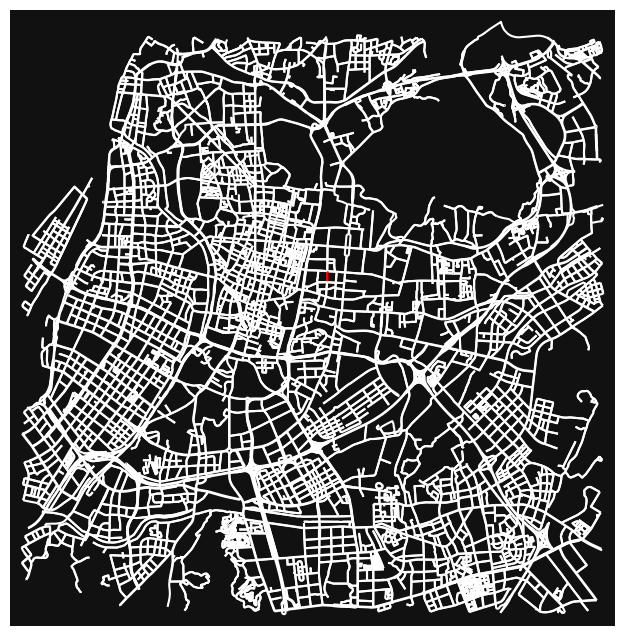

In [142]:
# 可视化选中边 #
# 如果是列表判断需要用 in，具体的 tuple 就用 == #
ec = ["r" if (u, v, k) in [(4415893510, 1030579415, 0), (1030579415, 4415893510,  0)] else "w" for u, v, k in G.edges(keys=True)]
    
fig, ax = ox.plot_graph(G, node_size=0, edge_color=ec, edge_linewidth=1.5)

In [143]:
# 取需要可视化的分组 #
grp = groupby_road.get_group(largest_group)
grp

time      pm2d5       tmp        hmd
0  81536   2022-05-27 14:55:00  28.145000  22.89125  45.756250
   81537   2022-05-27 14:56:00  29.483000  23.30200  43.638500
   81538   2022-05-27 14:57:00  28.166500  23.77650  41.259000
   81539   2022-05-27 14:58:00  28.200500  24.15850  39.442500
   81540   2022-05-27 14:59:00  28.183000  24.48050  37.868000
...                        ...        ...       ...        ...
21 125946  2022-06-27 11:04:00  14.234000  36.10000  47.348500
   125947  2022-06-27 11:05:00  14.933500  36.10150  47.201500
   125948  2022-06-27 11:06:00  13.555000  36.10500  47.200000
   125949  2022-06-27 11:07:00  14.647778  36.10000  47.148333
   137461  2022-07-05 10:58:00  34.450500  31.49550  63.859500

[277373 rows x 4 columns]

In [144]:
# 需要设置time为index，默认多重索引优先的是 mob号，而非时间先后 #
grp = grp.set_index('time')
grp = grp.sort_values('time')
grp.index

Index(['2022-04-01 00:00:00', '2022-04-01 00:01:00', '2022-04-01 00:02:00',
       '2022-04-01 00:03:00', '2022-04-01 00:04:00', '2022-04-01 00:05:00',
       '2022-04-01 00:06:00', '2022-04-01 00:07:00', '2022-04-01 00:08:00',
       '2022-04-01 00:09:00',
       ...
       '2022-11-28 16:15:00', '2022-11-28 16:16:00', '2022-11-29 10:26:00',
       '2022-11-29 10:41:00', '2022-11-29 10:42:00', '2022-11-29 10:43:00',
       '2022-11-29 15:33:00', '2022-11-29 15:34:00', '2022-11-30 08:14:00',
       '2022-11-30 08:15:00'],
      dtype='object', name='time', length=277373)

In [145]:
## 道路级时序变化图 ## # 说实话，似乎不存在什么能用的规律，反而有很多反常理的表现 #
# 存在很多凌晨测量提高，反而是白天污染下降的情况 #
from plotly import graph_objects as go
from plotly.subplots import make_subplots
from plotly_resampler import register_plotly_resampler

# register_plotly_resampler(mode='auto')

fig = go.Figure()

## 描出所有resample数据
fig.add_trace(  
        go.Scatter(name="Road", 
        showlegend=True,
        # mode='markers'
        ),  ## 没有的话legend不显示       
        hf_x=grp.index,
        hf_y=grp.pm2d5
)


fig.update_layout(
            title_text="PM2.5 tendency of single road", #Add a chart title·
            title_font_family="Times New Roman",
            title_font_size = 20,
            title_font_color="darkblue", #Specify font color of the title
            title_x=0.5, #Specify the title position
            yaxis_title='PM2.5 concentration',
            # legend=dict(orientation="h", y=1.1, xanchor="left", x=0)
            )

fig

FigureWidgetResampler({
    'data': [{'name': '<b style="color:sandybrown">[R]</b> Road <i style="color:#fc9944">~6h</i>',
              'showlegend': True,
              'type': 'scatter',
              'uid': 'd6f24680-2517-47d5-a78f-cff5fff66896',
              'x': array([datetime.datetime(2022, 4, 1, 0, 0),
                          datetime.datetime(2022, 4, 1, 10, 5),
                          datetime.datetime(2022, 4, 23, 12, 54), ...,
                          datetime.datetime(2022, 10, 12, 9, 40),
                          datetime.datetime(2022, 11, 8, 8, 10),
                          datetime.datetime(2022, 11, 30, 8, 15)], dtype=object),
              'y': array([32.22789474,         nan,         nan, ...,         nan,         nan,
                                  nan])}],
    'layout': {'template': '...',
               'title': {'font': {'color': 'darkblue', 'family': 'Times New Roman', 'size': 20},
                         'text': 'PM2.5 tendency of single road',
  

## 给定坐标找最近节点

In [18]:
# 给定地理坐标
# coordinate = (32.03086666666667, 118.8109)

# 找到最近的节点
nearest_node = ox.nearest_nodes(G, ref[1].lon[0], ref[1].lat[0], return_dist=True) # 先经度后纬度，否则会错误！

nearest_node
# # 将路网转换为GeoDataFrame对象
# gdf = ox.graph_to_gdfs(G, nodes=True, edges=False)

# # 使用GeoDataFrame进行可视化或进一步分析


(1038854215, 74.61974315142751)

In [34]:
nearest_node

(1038854215, 74.61974315142751)

In [31]:
G.nodes[nearest_node[0]]

{'y': 32.0411106, 'x': 118.7823876, 'street_count': 3}

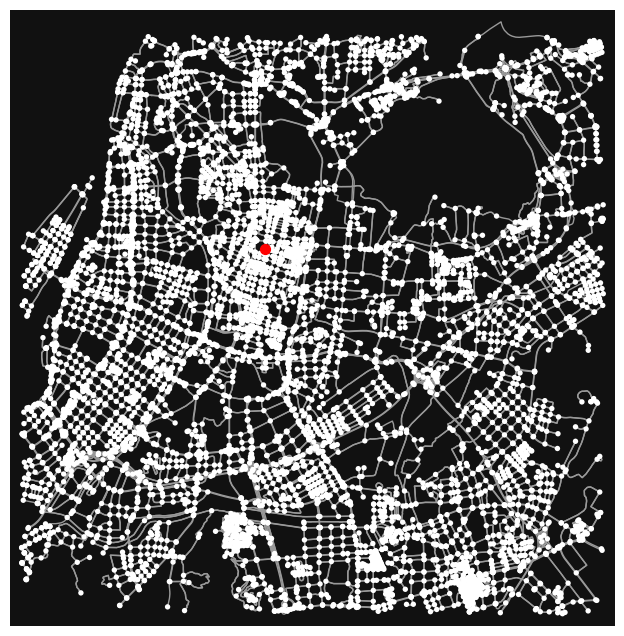

In [20]:
# 可视化指定osmid节点
fig, ax = ox.plot_graph(G, show=False, close=False)
ax.scatter(G.nodes[nearest_node[0]]['x'], G.nodes[nearest_node[0]]['y'], c='red', s=50)
plt.show()


In [35]:
nearest_edge = ox.nearest_edges(G, ref[1].lon[0], ref[1].lat[0])
nearest_edge

(1038854215, 771184498, 0)

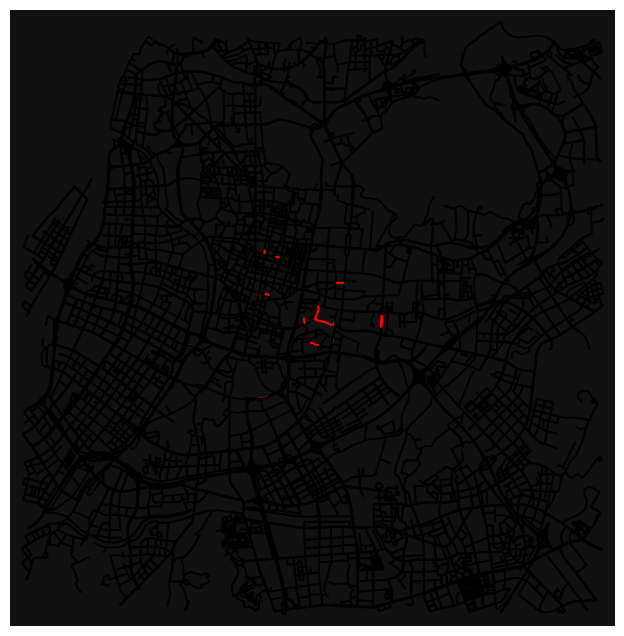

In [19]:
# 可视化选中边 #
# 如果是列表判断需要用 in，具体的 tuple 就用 == #
ec = ["red" if (u, v, k) in nearest_edges_ref_test else "black" for u, v, k in M.edges(keys=True)]
    
fig, ax = ox.plot_graph(M, node_size=0, edge_color=ec, edge_linewidth=1.5)

## 把初始图转为无向图，geopandas，line graph

In [7]:
# convert your MultiDiGraph to an undirected MultiGraph
M = ox.utils_graph.get_undirected(G)

In [313]:
# convert graph to line graph so edges become nodes and vice versa
edge_centrality = nx.closeness_centrality(nx.line_graph(G))
nx.set_edge_attributes(G, edge_centrality, "edge_centrality")